In [1]:
%matplotlib inline

import os
import json
import time
import pickle
import requests


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import plotly
import plotly.graph_objs as go

import warnings
warnings.filterwarnings('ignore')

from yellowbrick.features import Rank2D, RadViz, ParallelCoordinates, FeatureImportances
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, InterclusterDistance

from sklearn import metrics
from sklearn.metrics import f1_score, silhouette_samples, silhouette_score
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC, NuSVC, SVC
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler, StandardScaler, scale
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression, SGDClassifier
from sklearn.ensemble import BaggingClassifier, ExtraTreesClassifier, RandomForestClassifier
from sklearn.cluster import DBSCAN, KMeans, MiniBatchKMeans, AgglomerativeClustering

from yellowbrick.classifier import ClassificationReport

from sklearn.model_selection import train_test_split as tts

### Bringing in the data
Ingest the csv with the features we think will be of use. Then we do some last minute clean up and start exploring ML options, especially clustering on the data.

In [2]:
data = pd.read_csv("./data/wrangled_injury._withcounties_Mark.csv", encoding = 'cp850', dtype = 'unicode', 
                   usecols=["UPA", "EventDate", "State", "Latitude","Longitude","NAMELSAD", "Month", "Year", "InsideUS", "Event","Source","Primary NA","BodyPart", "Part_of _1", "Nature", "Amputation", "Hospitaliz"])

data = data.fillna(0)

pd.set_option('display.max_columns',None)
data['EventDate'] = data['EventDate'].astype('datetime64')
data['Month'] = pd.DatetimeIndex(data['EventDate']).month
data['Day'] = pd.DatetimeIndex(data['EventDate']).day
data['Year'] = pd.DatetimeIndex(data['EventDate']).year
data.InsideUS = data.InsideUS.astype("int64")
data.Hospitaliz = data.Hospitaliz.astype("int64")
data.Amputation = data.Amputation.astype("int64")
data.Nature = data.Nature.astype("int64")
data.Event = data.Event.astype("int64")
data.Source = data.Source.astype("int64")
data.BodyPart = data.BodyPart.astype("int64")
data.NAMELSAD = data.NAMELSAD.astype("str")
data['Latitude'] = data['Latitude'].astype('float')
data['Longitude'] = data['Longitude'].astype('float')
data = data.drop(39278, axis=0)
data['Primary NA'] = data['Primary NA'].astype('int64')

Previously we discovered that there was one cell in the columnn "Primary NA" that had a string of 48-49 instead of just 48 or 49. Since it is only one row, we dropped it during the ingest phase. Here we check to make sure it's gone.

In [3]:
data.loc[data['Primary NA'] == '48-49']

,UPA,EventDate,State,Latitude,Longitude,Primary NA,Hospitaliz,Amputation,Nature,BodyPart,Part_of _1,Event,Source,NAMELSAD,Month,Year,InsideUS,Day


Now to verify that the other columns such as Amputation and Hospitalization are binary in nature. We want to know if there was or was not an amputation or hospitalization.

In [4]:
data["Amputation"].value_counts()

0    29203
1    10603
2       23
3        3
9        1
4        1
Name: Amputation, dtype: int64

In [5]:
data["Hospitaliz"].value_counts()

1    31725
0     7861
2      242
3        5
5        1
Name: Hospitaliz, dtype: int64

Let's set the Amputation and Hospitalization columns to 0 & 1.

In [6]:
data = data[(data["Hospitaliz"] == 0)|(data["Hospitaliz"] == 1)]
data = data[(data["Amputation"] == 0)|(data["Amputation"] == 1)]

#### Next we use the "InsideUS" column to remove any rows from the dataset that occured outside of the 50 United States. 
Some occured in Africa, Scandinavia, Western Europe...

In [7]:
data["InsideUS"].value_counts()

1    39504
0       58
Name: InsideUS, dtype: int64

In [8]:
data.drop(data[data['InsideUS'] < 1].index, inplace = True)

In [9]:
data["InsideUS"].value_counts()

1    39504
Name: InsideUS, dtype: int64

In [10]:
data.head(5)

,UPA,EventDate,State,Latitude,Longitude,Primary NA,Hospitaliz,Amputation,Nature,BodyPart,Part_of _1,Event,Source,NAMELSAD,Month,Year,InsideUS,Day
1,1228909,2017-06-15,NEBRASKA,41.83,-96.71,311119,0,1,1311,4429,"Finger(s), fingernail(s), n.e.c.",6412,3714,Cuming County,6,2017,1,15
2,1238273,2017-06-24,NEBRASKA,41.79,-96.70,311512,0,1,1311,4422,Fingertip(s),6411,3421,Cuming County,6,2017,1,24
3,1384150,2018-09-17,NEBRASKA,41.79,-96.70,311512,1,0,1729,6,BODY SYSTEMS,531,9262,Cuming County,9,2018,1,17
4,930752,2015-01-06,NEBRASKA,40.98,-96.60,236220,1,0,111,52,Ankle(s),40,660,Lancaster County,1,2015,1,6
5,933523,2015-01-20,NEBRASKA,40.87,-96.62,331511,1,0,111,510,"Leg(s), unspecified",6260,3460,Lancaster County,1,2015,1,20


In [11]:
data.describe()

,Latitude,Longitude,Primary NA,Hospitaliz,Amputation,Nature,BodyPart,Event,Source,Month,Year,InsideUS,Day
count,39504.000000,39504.000000,39504.000000,39504.000000,39504.000000,39504.000000,39504.000000,39504.000000,39504.000000,39504.000000,39504.000000,39504.0,39504.000000
mean,36.720873,-87.786055,394686.489824,0.801615,0.267745,862.607306,2159.533490,3899.191069,4835.788123,6.301818,2016.489393,1.0,15.675856
std,5.464318,10.356193,159963.559763,0.398789,0.442790,766.101911,2658.374362,2504.936810,2929.099736,3.278137,1.103595,0.0,8.682277
min,19.410000,-166.540000,0.000000,0.000000,0.000000,7.000000,6.000000,20.000000,10.000000,1.000000,2015.000000,1.0,1.000000
25%,32.130000,-95.510000,311313.000000,1.000000,0.000000,111.000000,320.000000,642.000000,3222.000000,3.000000,2016.000000,1.0,8.000000
50%,38.780000,-87.640000,333120.000000,1.000000,0.000000,1311.000000,512.000000,4330.000000,4211.000000,6.000000,2016.000000,1.0,16.000000
75%,41.080000,-80.580000,491110.000000,1.000000,1.000000,1311.000000,4422.000000,6252.000000,7173.000000,9.000000,2017.000000,1.0,23.000000
max,70.250000,13.280000,999999.000000,1.000000,1.000000,9999.000000,9999.000000,9999.000000,9999.000000,12.000000,2018.000000,1.0,31.000000


#### More Cleanup
Now that we've removed any rows outside of the United States, we remove the "InsideUS" column as it is no longer needed.

In [12]:
data.drop('InsideUS', axis=1)

,UPA,EventDate,State,Latitude,Longitude,Primary NA,Hospitaliz,Amputation,Nature,BodyPart,Part_of _1,Event,Source,NAMELSAD,Month,Year,Day
1,1228909,2017-06-15,NEBRASKA,41.83,-96.71,311119,0,1,1311,4429,"Finger(s), fingernail(s), n.e.c.",6412,3714,Cuming County,6,2017,15
2,1238273,2017-06-24,NEBRASKA,41.79,-96.70,311512,0,1,1311,4422,Fingertip(s),6411,3421,Cuming County,6,2017,24
3,1384150,2018-09-17,NEBRASKA,41.79,-96.70,311512,1,0,1729,6,BODY SYSTEMS,531,9262,Cuming County,9,2018,17
4,930752,2015-01-06,NEBRASKA,40.98,-96.60,236220,1,0,111,52,Ankle(s),40,660,Lancaster County,1,2015,6
5,933523,2015-01-20,NEBRASKA,40.87,-96.62,331511,1,0,111,510,"Leg(s), unspecified",6260,3460,Lancaster County,1,2015,20
6,946968,2015-02-04,NEBRASKA,40.81,-96.63,623110,1,0,160,111,Brain,422,6650,Lancaster County,2,2015,4
7,947069,2015-02-05,NEBRASKA,40.82,-96.76,237110,1,0,111,510,"Leg(s), unspecified",429,6630,Lancaster County,2,2015,5
8,962317,2015-02-07,NEBRASKA,40.81,-96.70,561920,1,0,1972,341,Hip(s),422,6620,Lancaster County,2,2015,7
9,964870,2015-02-24,NEBRASKA,40.80,-96.65,238190,1,0,10,9999,Nonclassifiable,4333,9999,Lancaster County,2,2015,24
10,964805,2015-02-25,NEBRASKA,40.81,-96.70,238210,1,0,1972,423,Forearm(s),620,7352,Lancaster County,2,2015,25


In [13]:
data.dropna(how="any", inplace=True)

In [14]:
print("There are", data["NAMELSAD"].isna().sum(), "rows in NAMELSAD with NaN.")
print("There are a total of", len(data["UPA"]), "rows.")

There are 0 rows in NAMELSAD with NaN.
There are a total of 39504 rows.


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39504 entries, 1 to 39833
Data columns (total 18 columns):
UPA           39504 non-null object
EventDate     39504 non-null datetime64[ns]
State         39504 non-null object
Latitude      39504 non-null float64
Longitude     39504 non-null float64
Primary NA    39504 non-null int64
Hospitaliz    39504 non-null int64
Amputation    39504 non-null int64
Nature        39504 non-null int64
BodyPart      39504 non-null int64
Part_of _1    39504 non-null object
Event         39504 non-null int64
Source        39504 non-null int64
NAMELSAD      39504 non-null object
Month         39504 non-null int64
Year          39504 non-null int64
InsideUS      39504 non-null int64
Day           39504 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(11), object(4)
memory usage: 5.7+ MB


### Tallying up the features. 

Created a histogram plot of all the features in the dataset.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000257E1D775C0>,
      dtype=object)

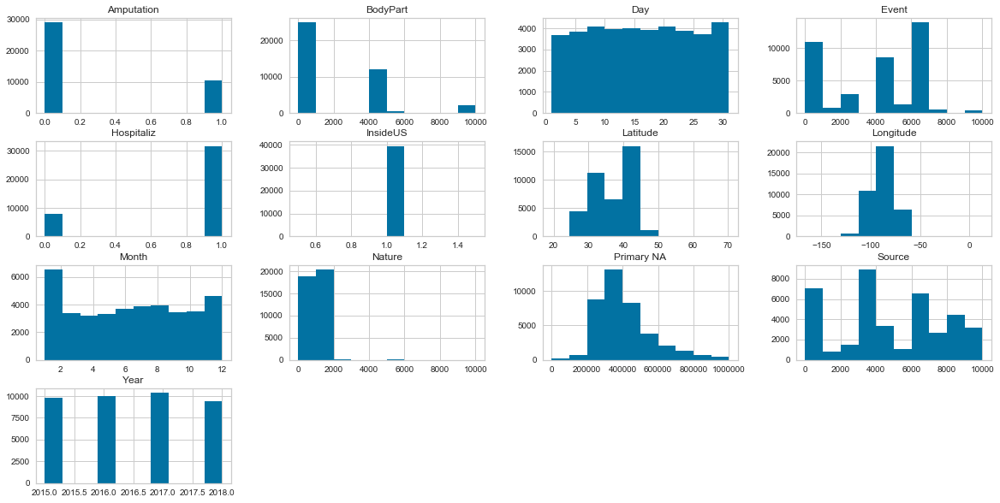

In [16]:
data.hist(figsize=(20,10))

#### Are any states disproportinately represented?
Also created a Seaborn countplot of the number of events in each state.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]),
 <a list of 51 Text xticklabel objects>)

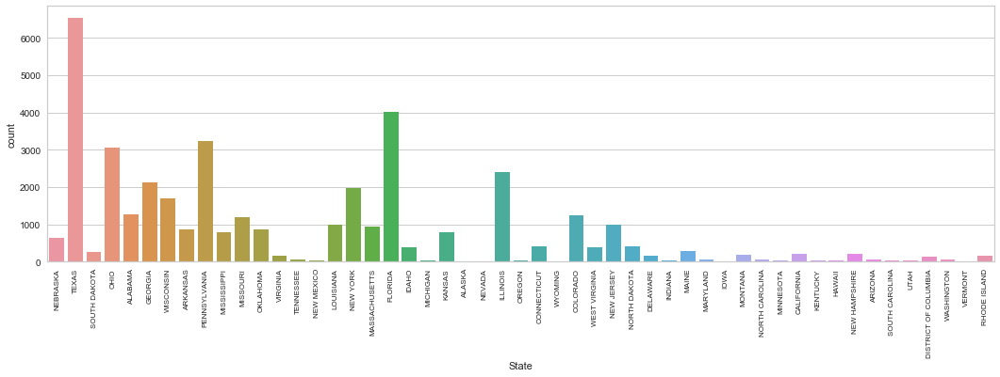

In [17]:
categorical_attributes = data.select_dtypes(include=['object'])

plt.figure(figsize=[18,5])
sns.countplot(data = categorical_attributes, x = 'State')
plt.xticks(rotation=90, fontsize=8)

In [7]:
#Label Encode the two non-numerical value features
le = LabelEncoder()
data['State'] = le.fit_transform(data.State.values)
data['NAMELSAD_Codes'] = le.fit_transform(data.NAMELSAD.values)

Create a bunch of feature sets - we are trying to figure out what might cluster well and help us as we go forward.

In [8]:
features = ["UPA","State","Source","BodyPart","Nature","NAMELSAD_Codes","Amputation","Month","Primary NA","Event"]
target = ["Hospitaliz"]

X = data[features]
y = data[target]
X.set_index('UPA',inplace=True)
X.name = "X"

features2 = ["UPA","State","Source","BodyPart","Nature","NAMELSAD_Codes",'Hospitaliz',"Month","Primary NA","Event"]
target2= ["Amputation"]

X2 = data[features2]
y2 = data[target2]
X2.set_index('UPA',inplace=True)
X2.name = "X2"

features3 =["UPA","State","Source","BodyPart","Nature","NAMELSAD_Codes",'Hospitaliz','Amputation',"Month","Primary NA","Event"] 
X3 = data[features3]
X3.set_index('UPA', inplace=True)
X3.name = "X3"

features4 =['UPA','Event','State']
Xevents = data[features4]
Xevents.set_index('UPA', inplace=True)
Xevents.name = "Xevents"

features5=["UPA","NAMELSAD_Codes","Primary NA","Event"]
Xevents2 = data[features5]
Xevents2.set_index('UPA', inplace=True)
Xevents2.name= "X_Events with Primary NA"

features6=['UPA','Event','State','Latitude','Longitude']
X_events_LL = data[features6]
X_events_LL.set_index('UPA',inplace=True)
X_events_LL.name="X_Events_LatLong"

features7 = ['UPA','Event','NAMELSAD_Codes','Primary NA','Hospitaliz','Amputation']
X_countyevents = data[features7]
X_countyevents.set_index('UPA',inplace=True)
X_countyevents.name="X Events at County Level"


#### Some Rankings and EDA of the feature sets.

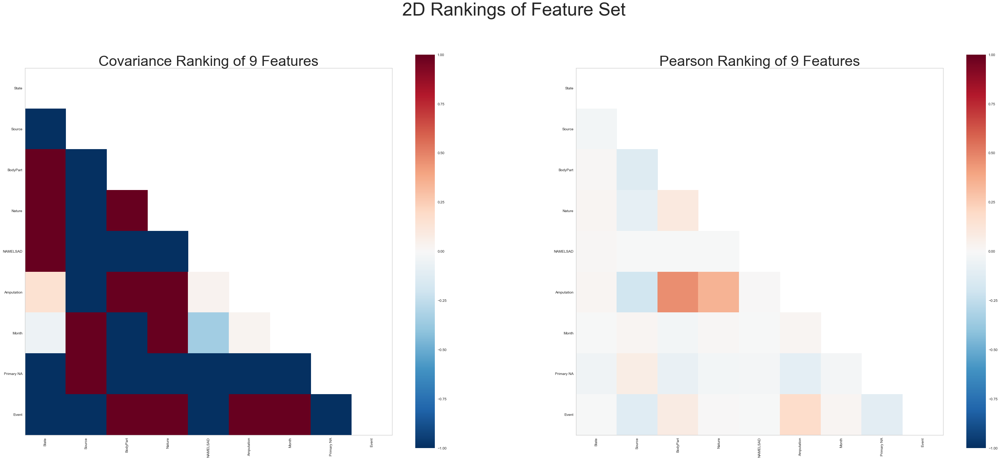

In [21]:
fig, axes = plt.subplots(1,2, figsize=(50,20))
fig.suptitle("2D Rankings of Feature Set", fontsize=50)

visualgrid = [
    Rank2D(algorithm="covariance", ax=axes[0]),
    Rank2D(algorithm="pearson", ax=axes[1]),
]

for viz in visualgrid:
    viz.fit_transform(X)
    viz.finalize()

axes[0].set_title("Covariance Ranking of 9 Features",fontsize=40)
axes[1].set_title("Pearson Ranking of 9 Features",fontsize=40)
plt.show()

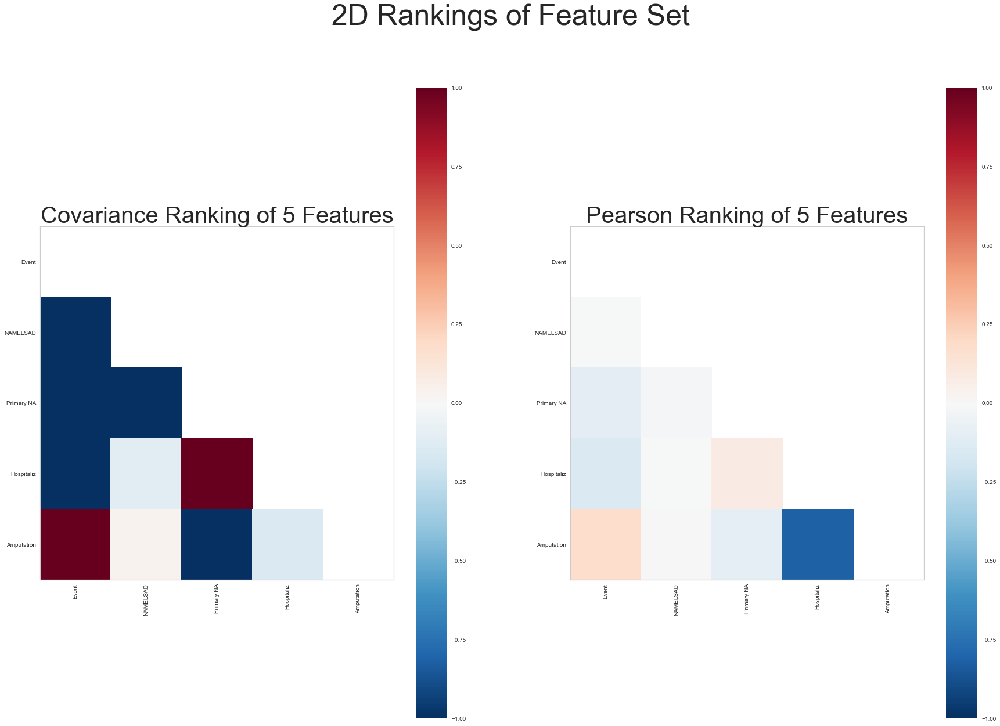

In [22]:
fig, axes = plt.subplots(1,2, figsize=(30,20))
fig.suptitle("2D Rankings of Feature Set", fontsize=50)

visualgrid = [
    Rank2D(algorithm="covariance", ax=axes[0]),
    Rank2D(algorithm="pearson", ax=axes[1]),
]

for viz in visualgrid:
    viz.fit_transform(X_countyevents)
    viz.finalize()

axes[0].set_title("Covariance Ranking of 5 Features",fontsize=40)
axes[1].set_title("Pearson Ranking of 5 Features",fontsize=40)
plt.show()

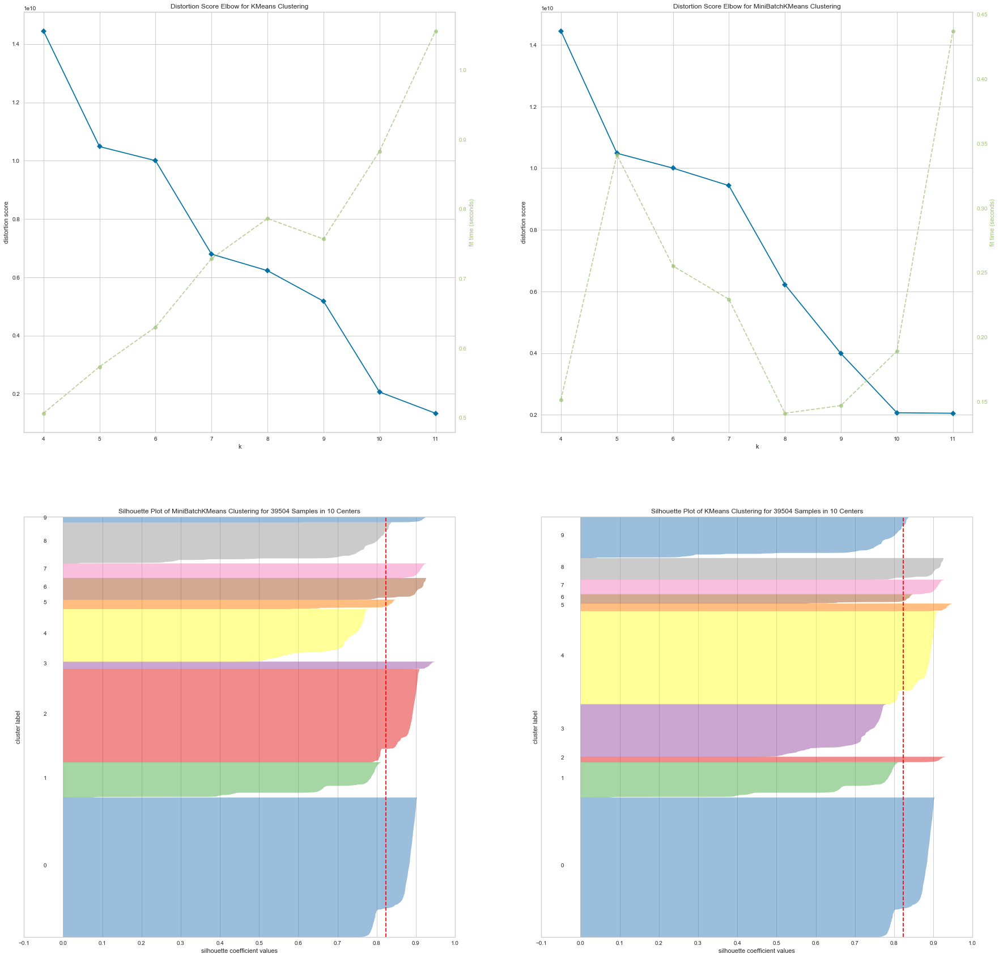

In [20]:
fig, axes = plt.subplots(2, 2, figsize=(30,30))
         
visualgrid = [
    KElbowVisualizer(KMeans(10,n_init=15), k=(4,12),ax=axes[0][0]),
    KElbowVisualizer(MiniBatchKMeans(10,n_init=15),k=(4,12), ax=axes[0][1]),
    SilhouetteVisualizer(MiniBatchKMeans(10, n_init=15),ax=axes[1][0]),
    SilhouetteVisualizer(KMeans(10, n_init=15), ax=axes[1][1]),

]

for viz in visualgrid:
    if viz is not SilhouetteVisualizer:
        viz.fit(X)
    else:
        viz.fit_transform(X)
    viz.finalize()

plt.show()

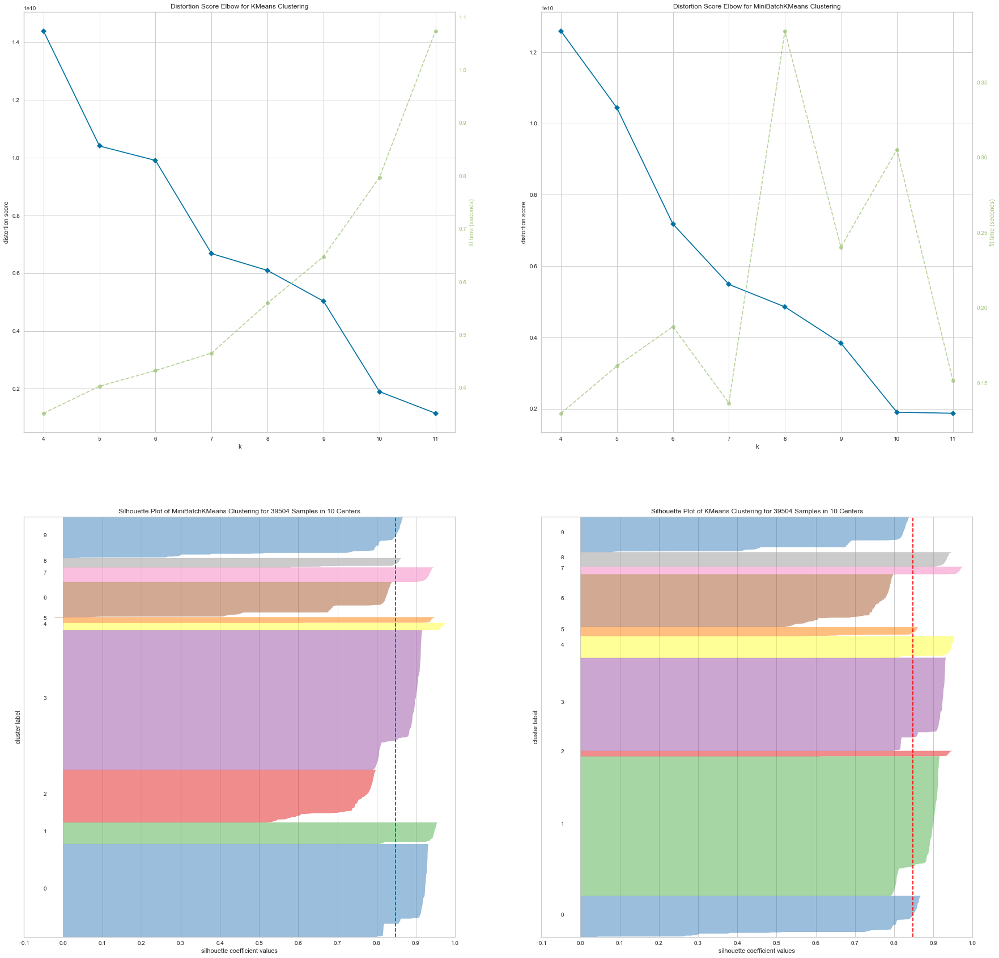

In [21]:
fig, axes = plt.subplots(2, 2, figsize=(30,30))
         
visualgrid = [
    KElbowVisualizer(KMeans(10,n_init=15), k=(4,12),ax=axes[0][0]),
    KElbowVisualizer(MiniBatchKMeans(10,n_init=15),k=(4,12), ax=axes[0][1]),
    SilhouetteVisualizer(MiniBatchKMeans(10, n_init=15),ax=axes[1][0]),
    SilhouetteVisualizer(KMeans(10, n_init=15), ax=axes[1][1]),

]

for viz in visualgrid:
    if viz is not SilhouetteVisualizer:
        viz.fit(X_countyevents)
    else:
        viz.fit_transform(X_countyevents)
    viz.finalize()

plt.show()

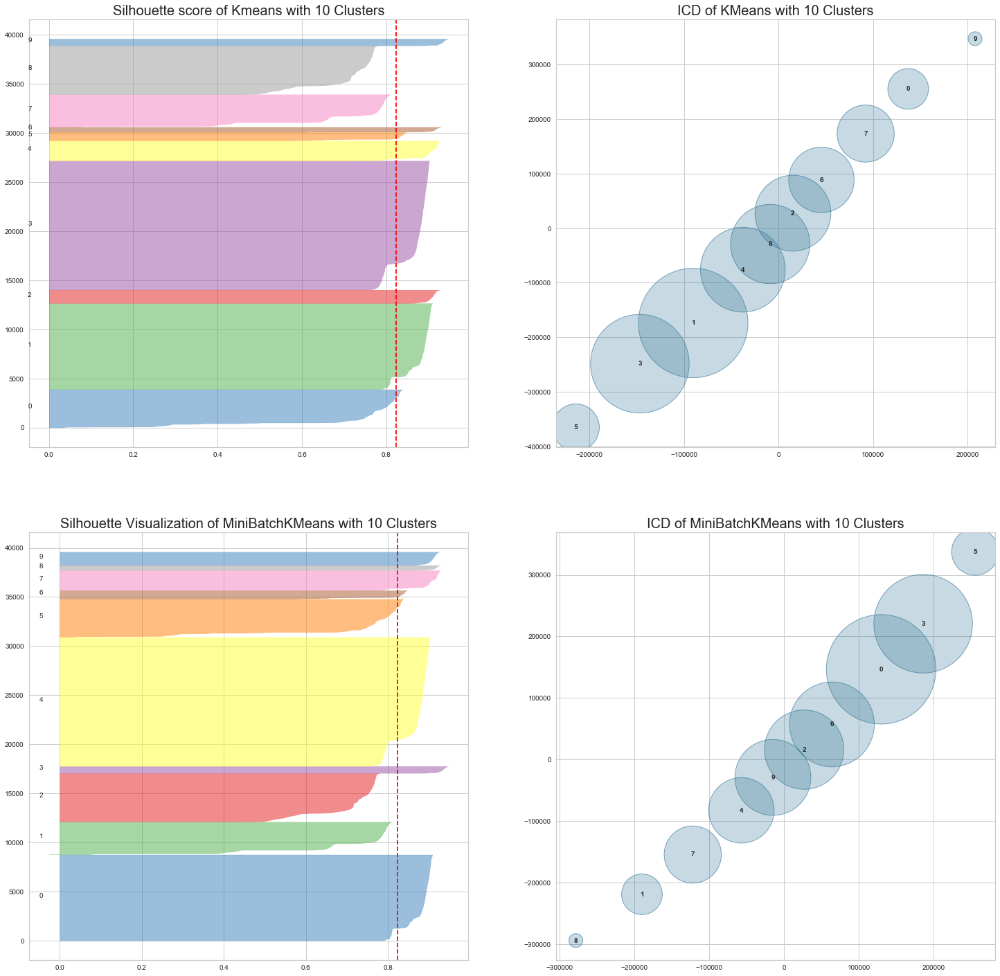

In [25]:
fig, axes = plt.subplots(2,2,figsize=(25,25))

visualgrid = [
    SilhouetteVisualizer(KMeans(10, n_init=15), ax=axes[0][0]),
    InterclusterDistance(KMeans(10),legend_loc='lower right',n_iter=15, ax=axes[0][1]),
    SilhouetteVisualizer(MiniBatchKMeans(10, n_init=15),ax=axes[1][0]),
    InterclusterDistance(MiniBatchKMeans(10),legend_loc='lower right',n_iter=15, ax=axes[1][1]),

]

for viz in visualgrid:
    viz.fit(X)
    
axes[0][0].set_title("Silhouette score of Kmeans with 10 Clusters", fontsize=20)
axes[0][1].set_title("ICD of KMeans with 10 Clusters", fontsize=20)
axes[1][0].set_title("Silhouette Visualization of MiniBatchKMeans with 10 Clusters", fontsize=20)
axes[1][1].set_title("ICD of MiniBatchKMeans with 10 Clusters",fontsize=20)

plt.show()

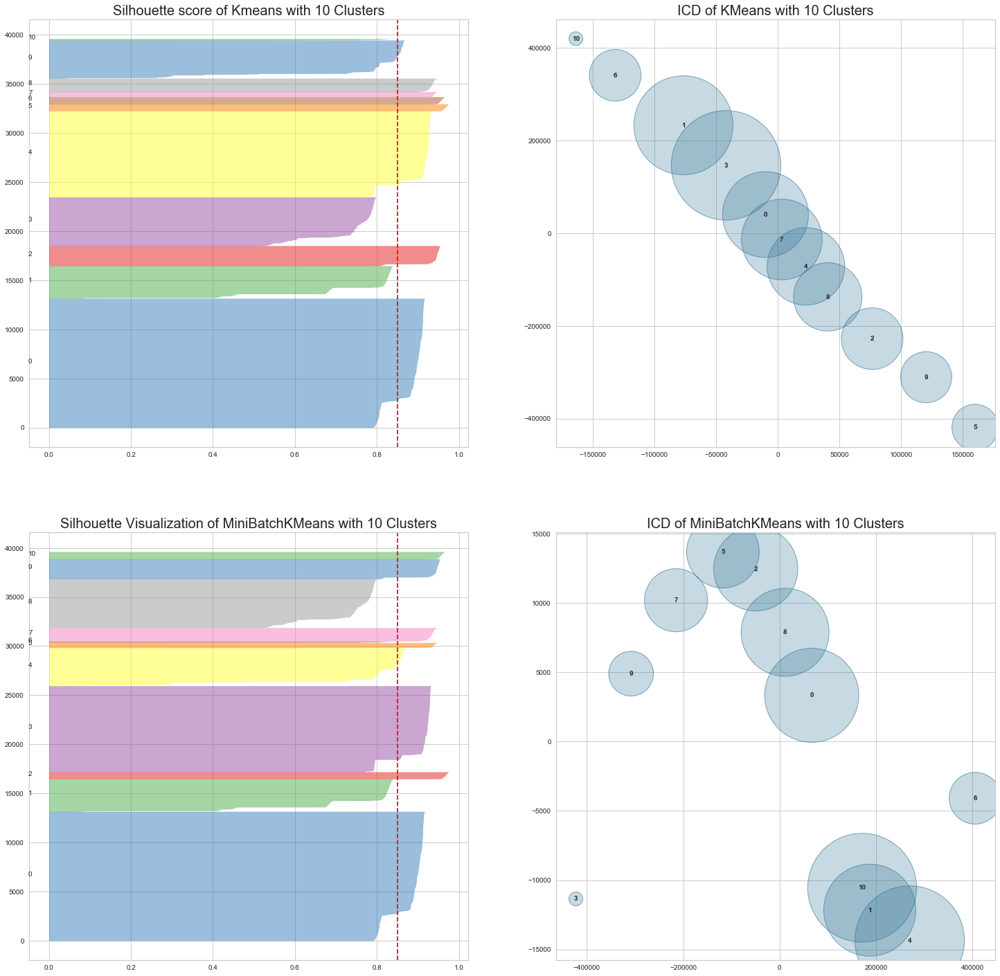

In [26]:
fig, axes = plt.subplots(2,2,figsize=(25,25))

visualgrid = [
    SilhouetteVisualizer(KMeans(11, n_init=15), ax=axes[0][0]),
    InterclusterDistance(KMeans(11),legend_loc='lower right',n_iter=15, ax=axes[0][1]),
    SilhouetteVisualizer(MiniBatchKMeans(11, n_init=15),ax=axes[1][0]),
    InterclusterDistance(MiniBatchKMeans(11),legend_loc='lower right',n_iter=15, ax=axes[1][1]),

]

for viz in visualgrid:
    viz.fit(X_countyevents)
    
axes[0][0].set_title("Silhouette score of Kmeans with 10 Clusters", fontsize=20)
axes[0][1].set_title("ICD of KMeans with 10 Clusters", fontsize=20)
axes[1][0].set_title("Silhouette Visualization of MiniBatchKMeans with 10 Clusters", fontsize=20)
axes[1][1].set_title("ICD of MiniBatchKMeans with 10 Clusters",fontsize=20)

plt.show()

In [41]:
def score_model(X, y, estimator, **kwargs):
    """
    Test various estimators.
    """ 
    y = LabelEncoder().fit_transform(y)
    model = Pipeline([
         ('one_hot_encoder', OneHotEncoder()), 
         ('estimator', estimator)
    ])

    # Instantiate the classification model and visualizer
    model.fit(X, y, **kwargs)  
    
    expected  = y
    predicted = model.predict(X)
    
    # Compute and return F1 (harmonic mean of precision and recall)
    print("{} {}: {}".format(X.name,estimator.__class__.__name__, f1_score(expected, predicted)))

In [42]:
# Try them all!

models = [
    SVC(gamma='auto'), LinearSVC(), 
    SGDClassifier(max_iter=100, tol=1e-3), KNeighborsClassifier(), 
    LogisticRegression(solver='lbfgs'), LogisticRegressionCV(cv=3), 
    BaggingClassifier(), ExtraTreesClassifier(n_estimators=100), 
    RandomForestClassifier(n_estimators=100)
]

features = [X,Xevents,Xevents2]

for model in models:
    for feature in features:
            score_model(feature, y, model)

X SVC: 0.9531636795722348
Xevents SVC: 0.8914755220814791
X_Events with Primary NA SVC: 0.8898849250396931
X LinearSVC: 0.9698517483416053
Xevents LinearSVC: 0.8986965978186667
X_Events with Primary NA LinearSVC: 0.9186378177348441
X SGDClassifier: 0.9602766766178894
Xevents SGDClassifier: 0.891879169574886
X_Events with Primary NA SGDClassifier: 0.9080097711493957
X KNeighborsClassifier: 0.9623934103841255
Xevents KNeighborsClassifier: 0.8943478877456155
X_Events with Primary NA KNeighborsClassifier: 0.9254696021005857
X LogisticRegression: 0.9648340282491353
Xevents LogisticRegression: 0.900808921699521
X_Events with Primary NA LogisticRegression: 0.9170664409117989
X LogisticRegressionCV: 0.9568174757599046
Xevents LogisticRegressionCV: 0.900751148677257
X_Events with Primary NA LogisticRegressionCV: 0.9062824386087226
X BaggingClassifier: 0.9941592864171666
Xevents BaggingClassifier: 0.9055581089433729
X_Events with Primary NA BaggingClassifier: 0.9832425240750127
X ExtraTreesClass

XSVC


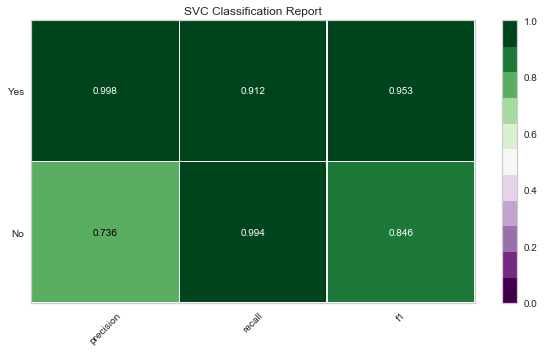

XLinearSVC


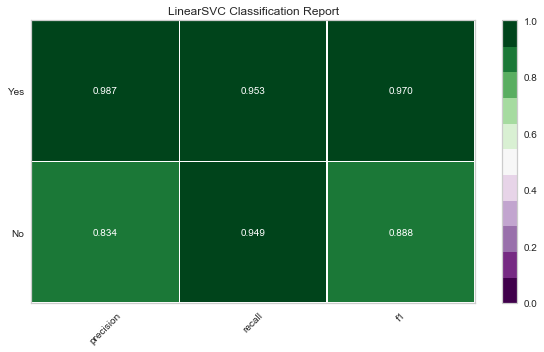

XSGDClassifier


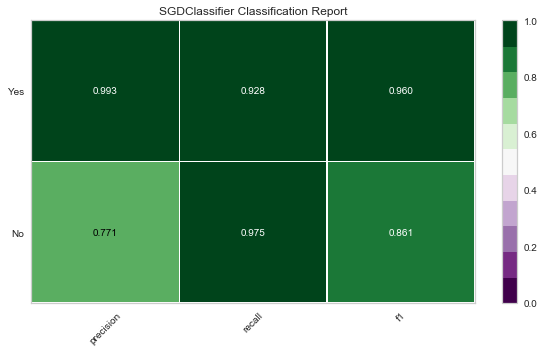

XKNeighborsClassifier


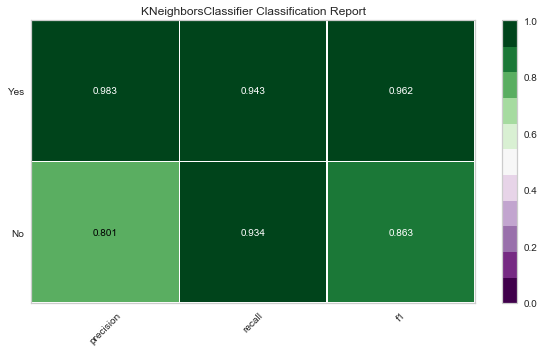

XLogisticRegression


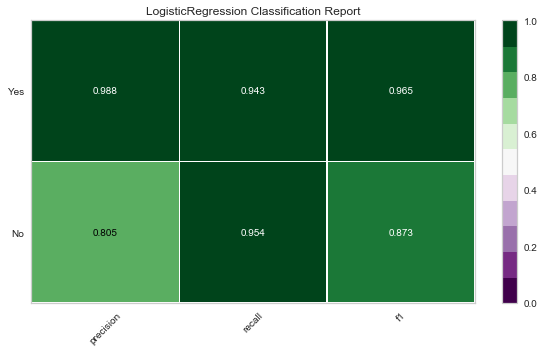

XLogisticRegressionCV


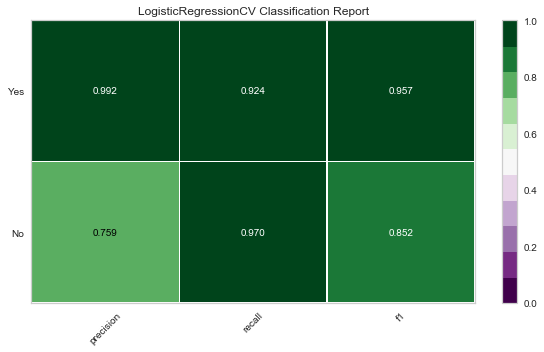

XBaggingClassifier


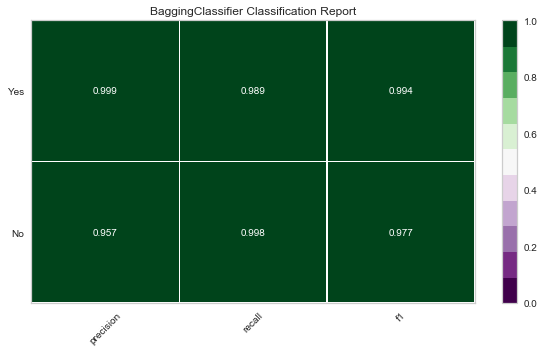

XExtraTreesClassifier


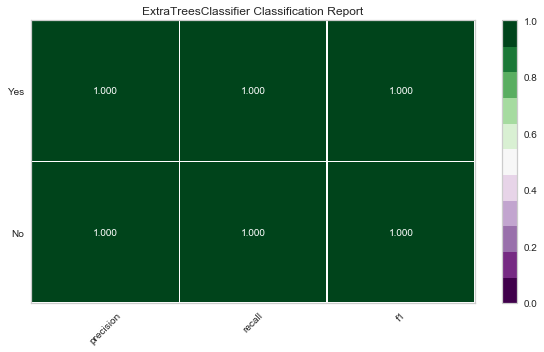

XRandomForestClassifier


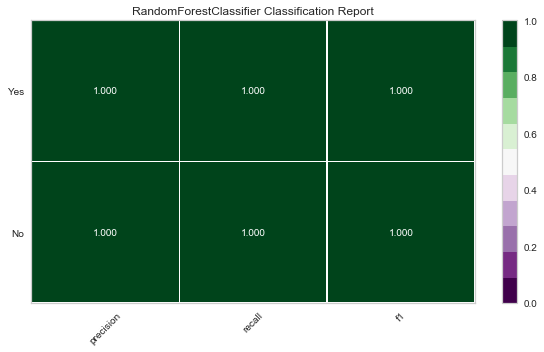

In [44]:
def visualize_model(X, y, estimator):
    """
    Test various estimators.
    """ 
    y = LabelEncoder().fit_transform(y)
    model = Pipeline([
         ('one_hot_encoder', OneHotEncoder()), 
         ('estimator', estimator)
    ])

    # Instantiate the classification model and visualizer
    visualizer = ClassificationReport(
        model, classes=['No', 'Yes'], 
        cmap='PRGn', size=(600, 360)
    )
    visualizer.fit(X, y)  
    visualizer.score(X, y)
    print("{} {}".format(X.name,estimator.__class__.__name__))
    visualizer.poof()  

for model in models:
    visualize_model(X, y, model)

In [31]:
features=Xevents.values

In [52]:
def makeheatmap(data, **kwargs):
    corr = data.corr()
    ax = sns.heatmap(
        corr, 
        vmin=-1, vmax=1, center=0,
        cmap=sns.diverging_palette(20, 220, n=200),
        square=True
    )
    ax.set_xticklabels(
        ax.get_xticklabels(),
        rotation=45,
        horizontalalignment='right'
    )

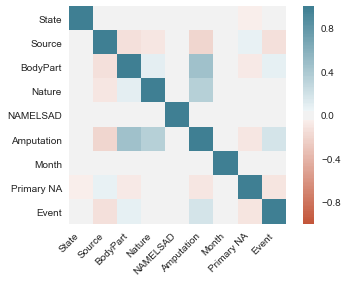

In [170]:
makeheatmap(X)

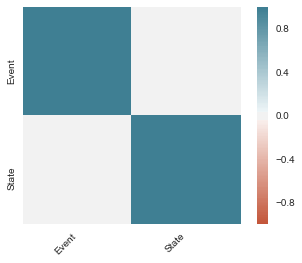

In [171]:
makeheatmap(Xevents)

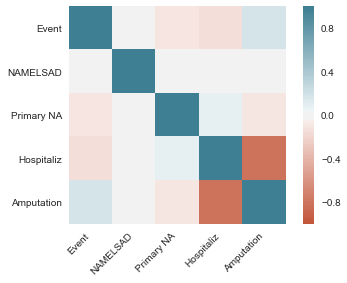

In [172]:
makeheatmap(X_countyevents)

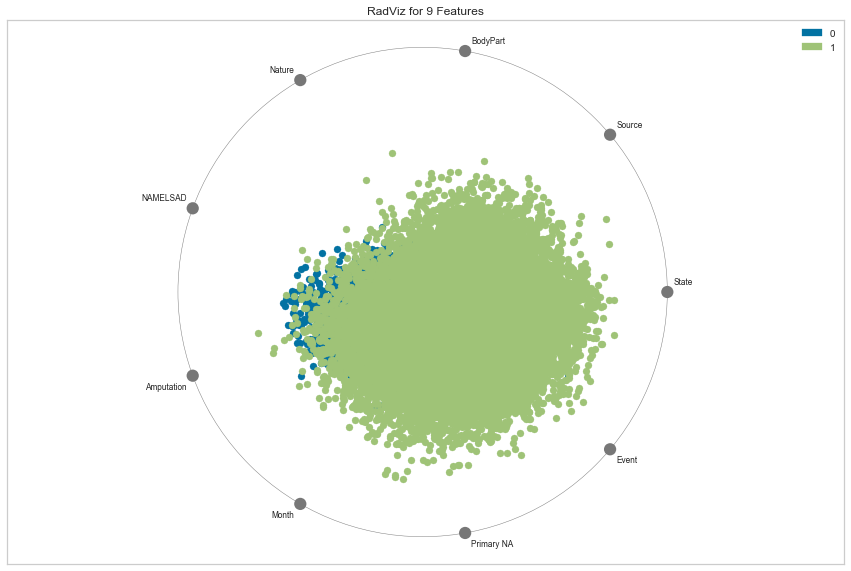

In [173]:
# Encode our target variable
encoder = LabelEncoder().fit(y)
y = encoder.transform(y)

# Specify the target classes
classes = [encoder.classes_]

# Instantiate the visualizer
visualizer = RadViz(size=(1080, 720))

visualizer.fit(X, y)           # Fit the data to the visualizer
visualizer.transform(X)        # Transform the data
visualizer.poof()              # Draw/show/poof the data

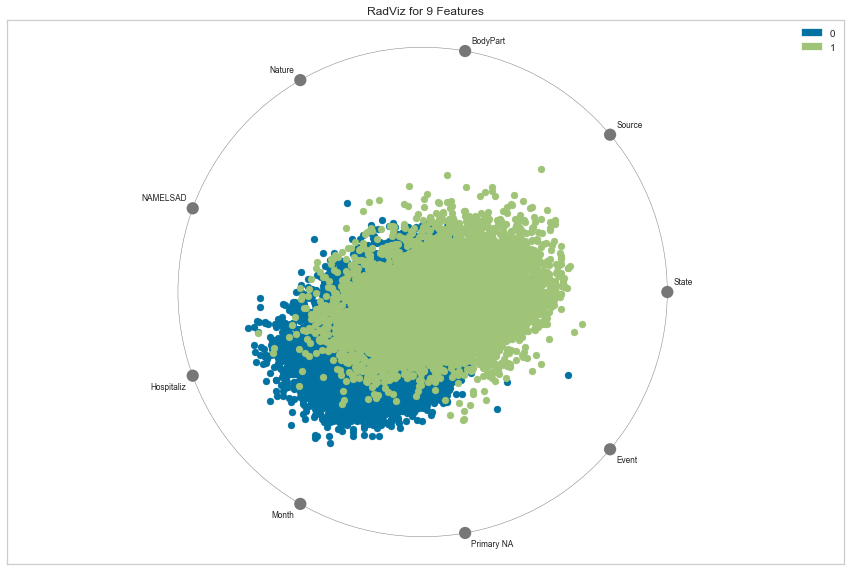

In [174]:
encoder = LabelEncoder().fit(y2)
y2 = encoder.transform(y2)

# Specify the target classes
classes = [encoder.classes_]

# Instantiate the visualizer
visualizer = RadViz(size=(1080, 720))

visualizer.fit(X2, y2)           # Fit the data to the visualizer
visualizer.transform(X2)        # Transform the data
visualizer.poof()              # Draw/show/poof the data

Here we create a function to evaluate the performance of the different clustering models with different values for k. It takes a bit to run but returns some interesting results.

In [14]:
def bench_clustering(data, n_cluster):
    models = [
    KMeans(), MiniBatchKMeans(), 
    AgglomerativeClustering(n_clusters=n_cluster, linkage='ward'),
    AgglomerativeClustering(n_clusters=n_cluster, linkage='average'),
    AgglomerativeClustering(n_clusters=n_cluster, linkage='complete'),
    DBSCAN(eps=0.5,metric='euclidean')]
    
    for model in models:
        model.fit(data)
        silhouette = metrics.silhouette_score(data, model.labels_)
 
        print("Method Name:{}, # of Clusters:{}, Silhouette Score:{}".format(model.__class__.__name__,n_cluster,silhouette))

In [15]:
range_n_clusters = range(6,10)

for n_cluster in range_n_clusters:
    bench_clustering(Xevents,n_cluster)


Method Name:KMeans, # of Clusters:6, Silhouette Score:0.8554840295513454
Method Name:MiniBatchKMeans, # of Clusters:6, Silhouette Score:0.8554840295513454
Method Name:AgglomerativeClustering, # of Clusters:6, Silhouette Score:0.8821641483618549
Method Name:AgglomerativeClustering, # of Clusters:6, Silhouette Score:0.8821641483618549
Method Name:AgglomerativeClustering, # of Clusters:6, Silhouette Score:0.8821641483618549
Method Name:DBSCAN, # of Clusters:6, Silhouette Score:0.7326845110830787
Method Name:KMeans, # of Clusters:7, Silhouette Score:0.8554840295513454
Method Name:MiniBatchKMeans, # of Clusters:7, Silhouette Score:0.8554840295513454
Method Name:AgglomerativeClustering, # of Clusters:7, Silhouette Score:0.8479493403310953
Method Name:AgglomerativeClustering, # of Clusters:7, Silhouette Score:0.8896988375821052
Method Name:AgglomerativeClustering, # of Clusters:7, Silhouette Score:0.8479493403310953
Method Name:DBSCAN, # of Clusters:7, Silhouette Score:0.7326845110830787
Meth

In [16]:
#Forgot One!
bench_clustering2(Xevents,10)

Method Name:KMeans, # of Clusters:10, Silhouette Score:0.8554840295513454
Method Name:MiniBatchKMeans, # of Clusters:10, Silhouette Score:0.7898094946314074
Method Name:AgglomerativeClustering, # of Clusters:10, Silhouette Score:0.8454500523138355
Method Name:AgglomerativeClustering, # of Clusters:10, Silhouette Score:0.8435510106779214
Method Name:AgglomerativeClustering, # of Clusters:10, Silhouette Score:0.7892567305002927
Method Name:DBSCAN, # of Clusters:10, Silhouette Score:0.7326845110830787


### Evaluating Feature Sets in KMeans

Now that we've decided on KMeans with 10 clusters as our clustering algorithm, we need to decide on which set of features to cluster.

In [21]:
#Function to run multiple feature sets through KMeans, k=10 and plot the clusters.
def feature_cluster_scores(data):
    estimator = KMeans(10,n_init=15)
    features=data.values
    estimator.fit(features)
    silhouette = metrics.silhouette_score(features, estimator.labels_)
    
    clusterer = estimator
    cluster_labels = clusterer.fit_predict(features)
    feature['clusters'] = cluster_labels
    silhouette_avg=silhouette_score(features,cluster_labels)
       
    centers = estimator.cluster_centers_
    
    print(data.name +" Silhouette Score:{}".format(silhouette))
    print(data.name +" For 10 clusters, The average silhouette_score is :", silhouette_avg)
        
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)
    
    colors = cm.Spectral(cluster_labels.astype(float) / 10)
    ax1.scatter(features[:,0],features[:,1],marker='.', s=30, lw=0, alpha=0.7,c=colors)
    ax1.scatter(centers[:,0],centers[:,1],marker='o',c='white',alpha=1,s=200)
    
    for i, c in enumerate(centers):
        ax1.scatter(c[0],c[1],marker='$%d$' % i, alpha=1,s=50)
        
    ax1.set_title("Visualization of the clustered data.")
    plt.show()
    
    return feature

X Silhouette Score:0.822943007410941
X For 10 clusters, The average silhouette_score is : 0.822943007410941


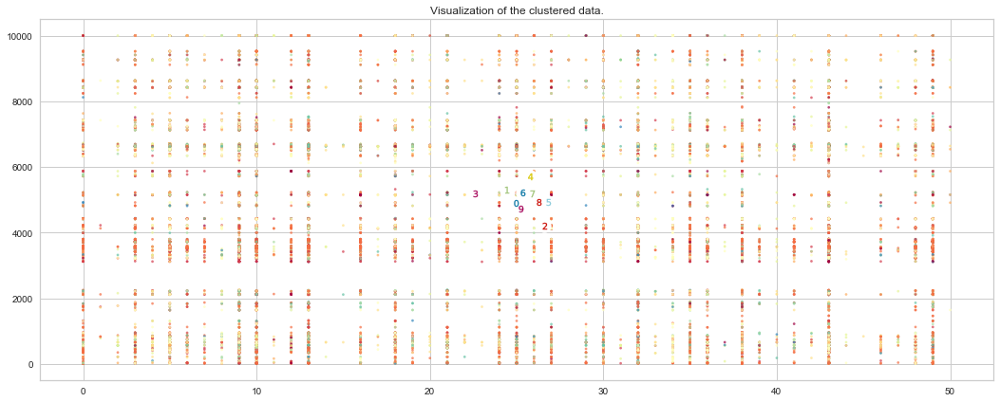

X2 Silhouette Score:0.8229430076294476
X2 For 10 clusters, The average silhouette_score is : 0.8229430076294476


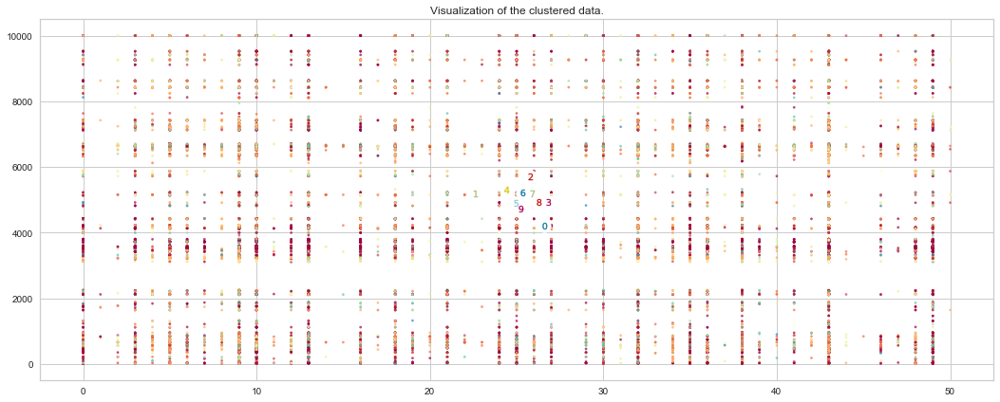

X3 Silhouette Score:0.8229430073920636
X3 For 10 clusters, The average silhouette_score is : 0.8229430073920636


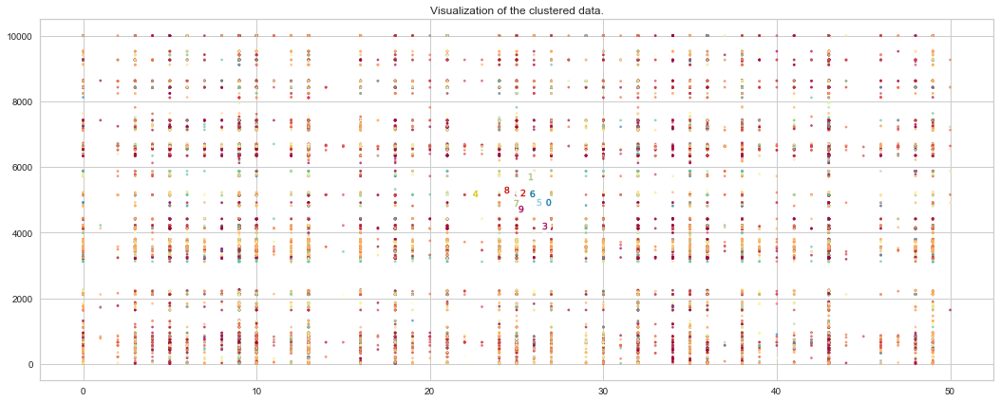

X_LatLong Silhouette Score:0.8229427455681496
X_LatLong For 10 clusters, The average silhouette_score is : 0.8229427455681496


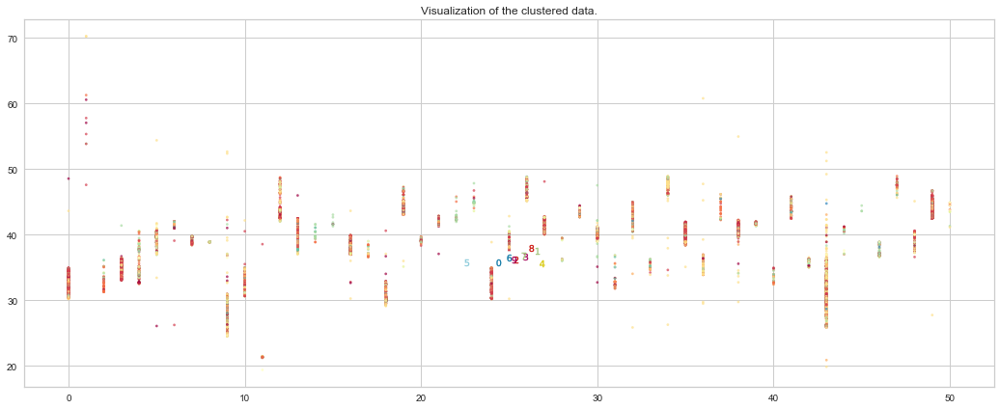

Xevents Silhouette Score:0.7981002157072986
Xevents For 10 clusters, The average silhouette_score is : 0.7981002157072986


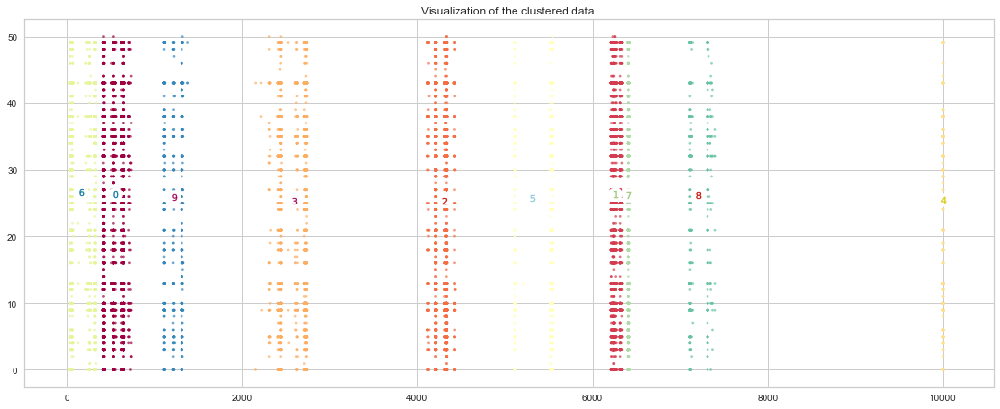

X_Events_LatLong Silhouette Score:0.7843112147145743
X_Events_LatLong For 10 clusters, The average silhouette_score is : 0.7843112147145743


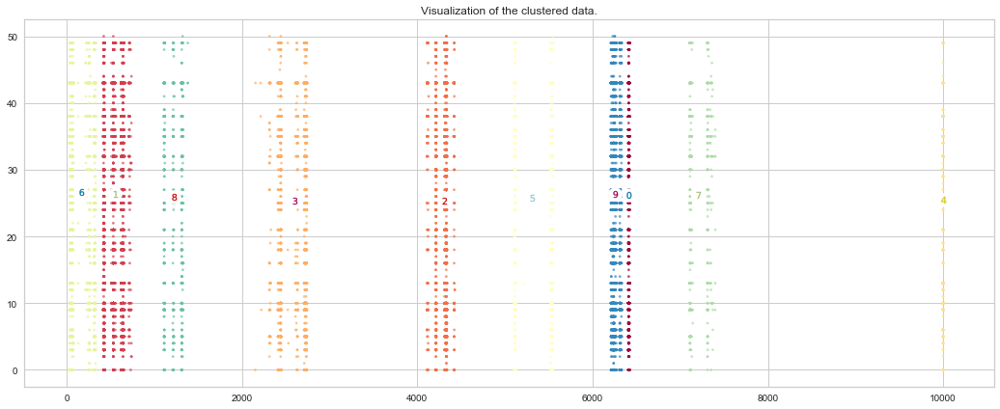

In [105]:
features = [X,X2,X3,X_ll,Xevents,X_events_LL]

for feature in features:
    feature_cluster_scores(feature)

In [104]:
#adapted from http://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_digits.html#sphx-glr-auto-examples-cluster-plot-kmeans-digits-py
def PCA_Redux(data, n_clusters):
    n_clusters = n_clusters
    features=data.values
    f_scaled = scale(features)
    reduced_data = PCA(n_components=2).fit_transform(f_scaled)
    kmeans = KMeans(init='random', n_clusters=n_clusters, n_init=15)
    kmeans.fit(reduced_data)

    # Step size of the mesh. Decrease to increase the quality of the VQ.
    h = .02     # point in the mesh [x_min, x_max]x[y_min, y_max].

    # Plot the decision boundary. For that, we will assign a color to each
    x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
    y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    # Obtain labels for each point in mesh. Use last trained model.
    Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure(1)
    plt.clf()
    plt.imshow(Z, interpolation='nearest',
               extent=(xx.min(), xx.max(), yy.min(), yy.max()),
               cmap=plt.cm.Paired,
               aspect='auto', origin='lower')

    plt.plot(reduced_data[:, 0], reduced_data[:, 1], 'k.', markersize=2)
    # Plot the centroids as a white X
    centroids = kmeans.cluster_centers_
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=169, linewidths=3,
                color='w', zorder=10)
    plt.title('K-means clustering on the Severe Injury Dataset (PCA-reduced data)\n'
              f'{data.name} feature-set\n'
              'Centroids are marked with white cross')
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.xticks(())
    plt.yticks(())
    plt.show()

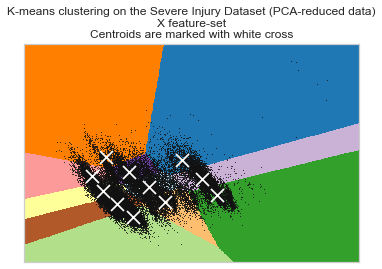

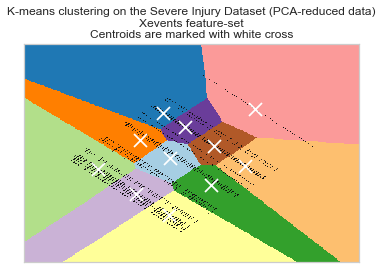

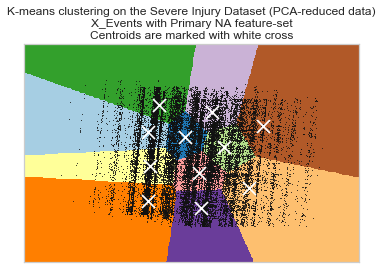

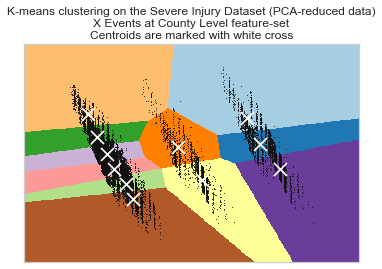

In [114]:
features =[X, Xevents,Xevents2, X_countyevents]

for feature in features:
    PCA_Redux(feature,11)

In [121]:
def silhouette_plot(X, range_n_clusters = range(4, 14, 2)):

    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1
        ax1.set_xlim([-.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X.iloc[:, 0], X.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors)

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1],
                    marker='o', c="white", alpha=1, s=200)

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle((f"Silhouette analysis for KMeans clustering on {X.name} data "
                      f"with n_clusters = {n_clusters}"),
                     fontsize=14, fontweight='bold')

        plt.show()

For n_clusters = 4 The average silhouette_score is : 0.7041214753553898


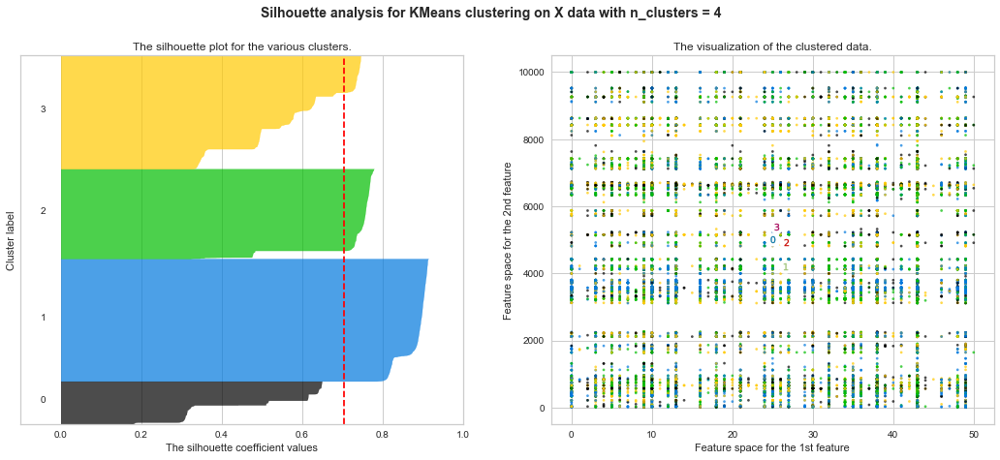

For n_clusters = 6 The average silhouette_score is : 0.7648308495798656


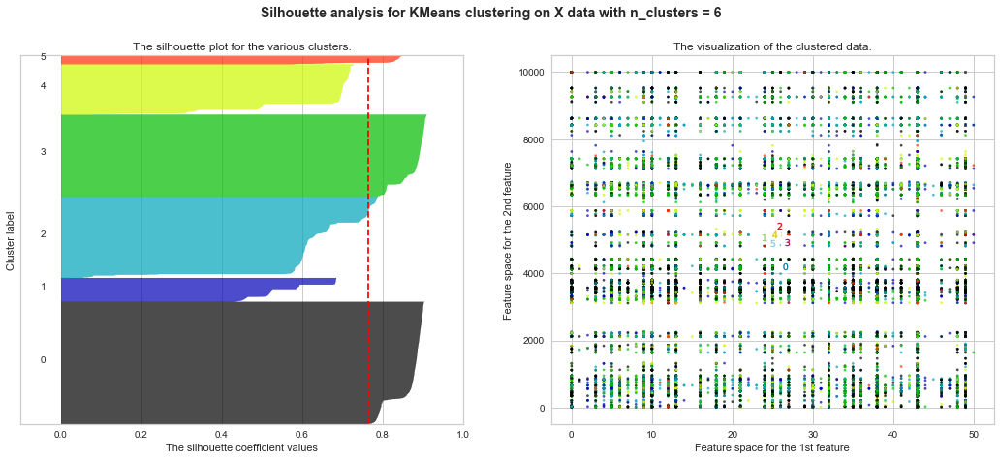

For n_clusters = 8 The average silhouette_score is : 0.7708332665251348


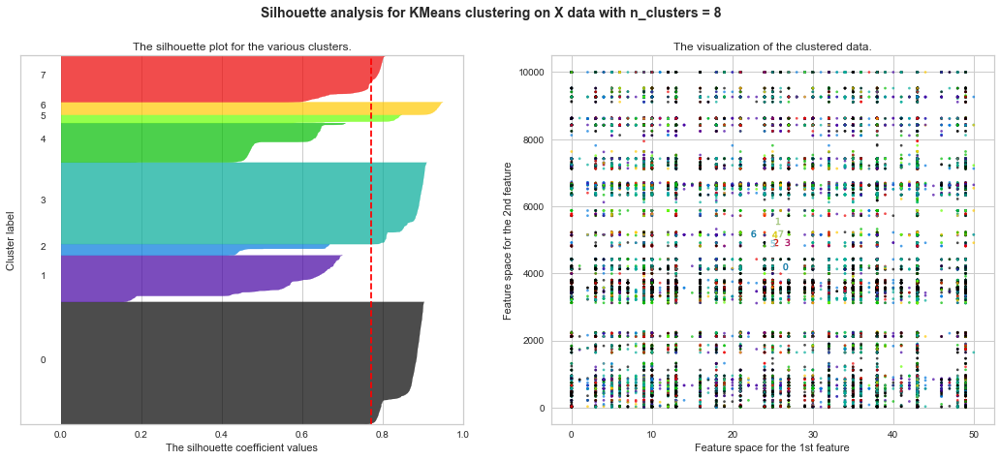

For n_clusters = 10 The average silhouette_score is : 0.822943006728927


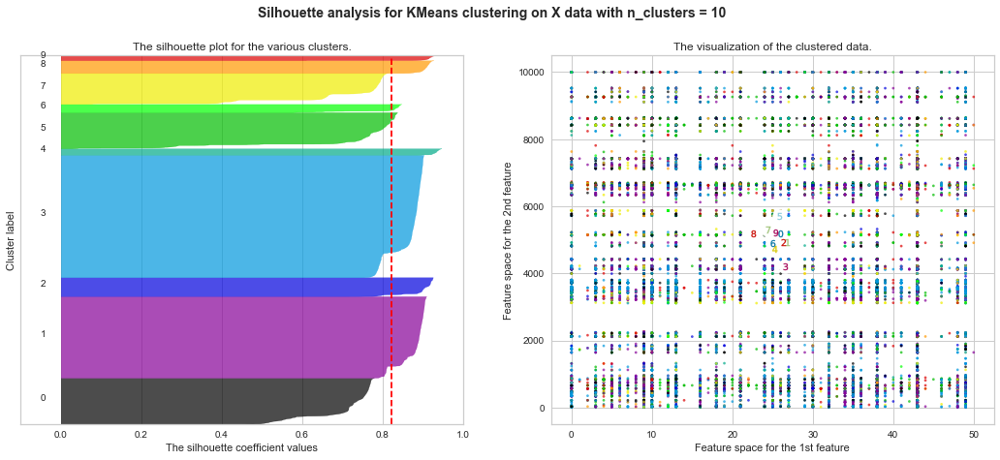

For n_clusters = 12 The average silhouette_score is : 0.6964340154920964


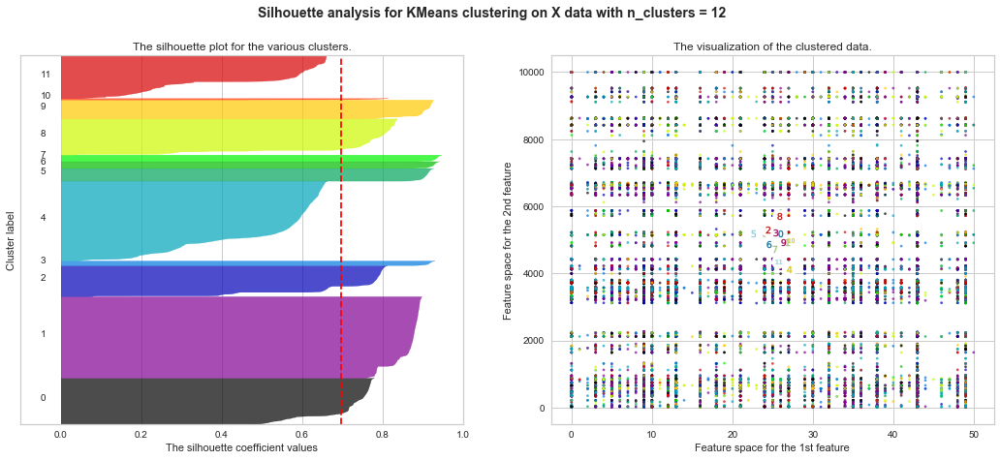

For n_clusters = 4 The average silhouette_score is : 0.8588279382463988


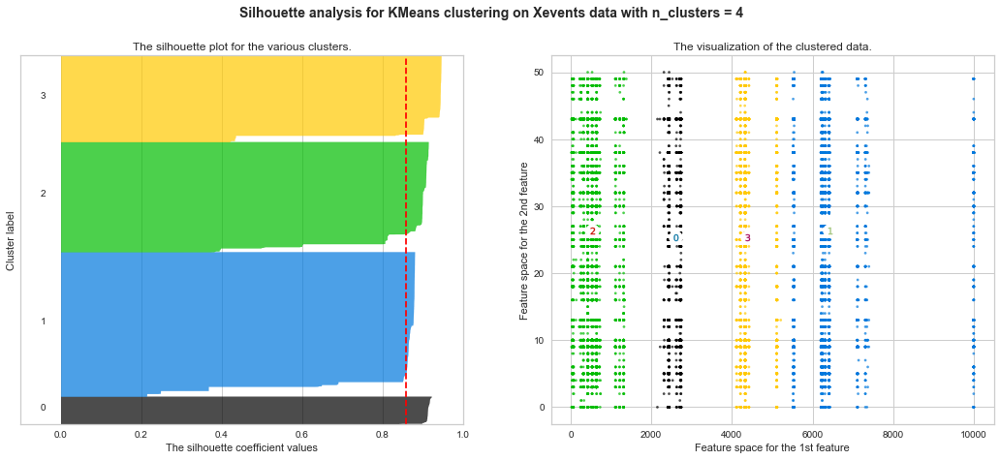

For n_clusters = 6 The average silhouette_score is : 0.8821641483618549


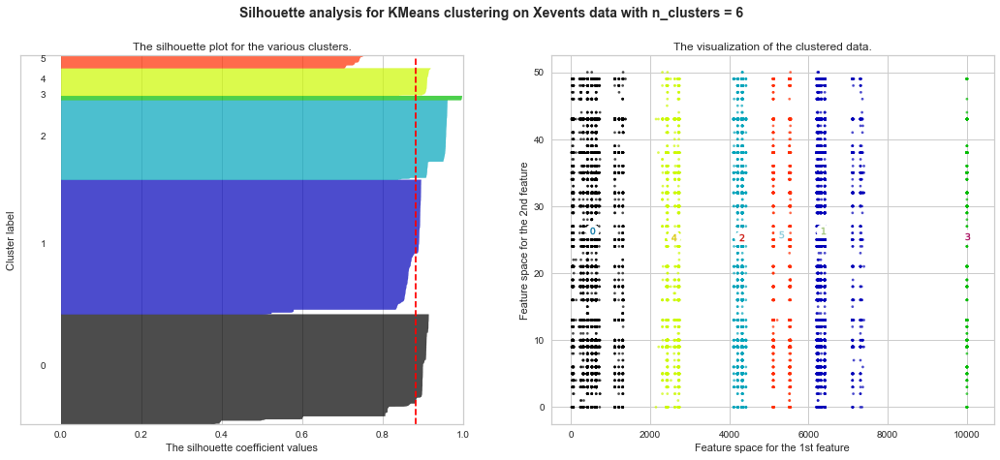

For n_clusters = 8 The average silhouette_score is : 0.8554840295513454


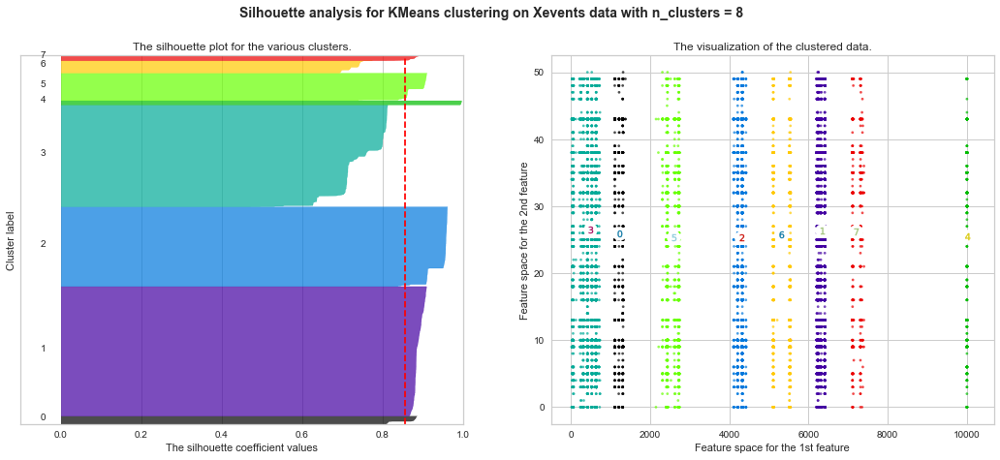

For n_clusters = 10 The average silhouette_score is : 0.7979528535212254


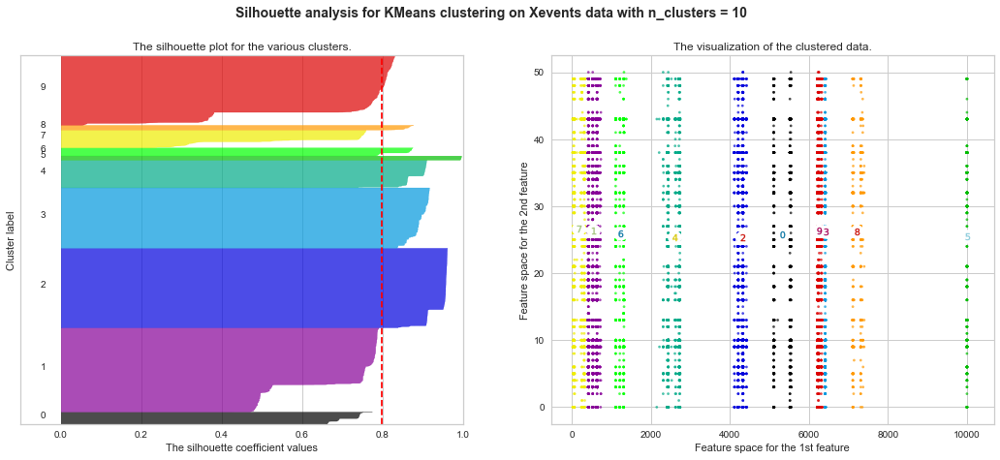

For n_clusters = 12 The average silhouette_score is : 0.8112359749379928


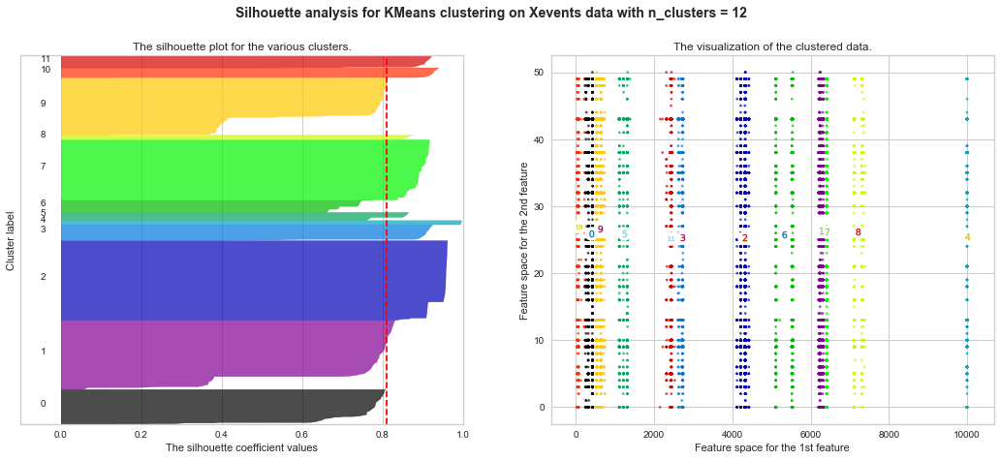

For n_clusters = 4 The average silhouette_score is : 0.7165936852133936


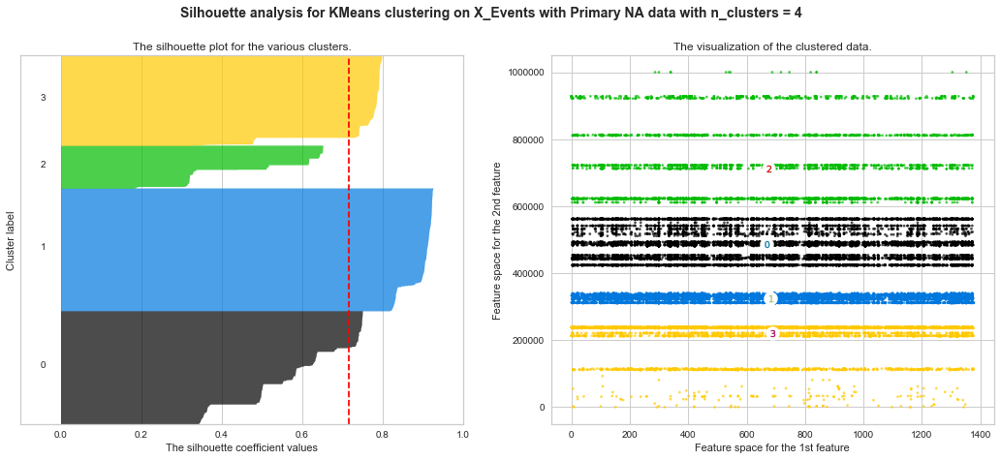

For n_clusters = 6 The average silhouette_score is : 0.7806340433732224


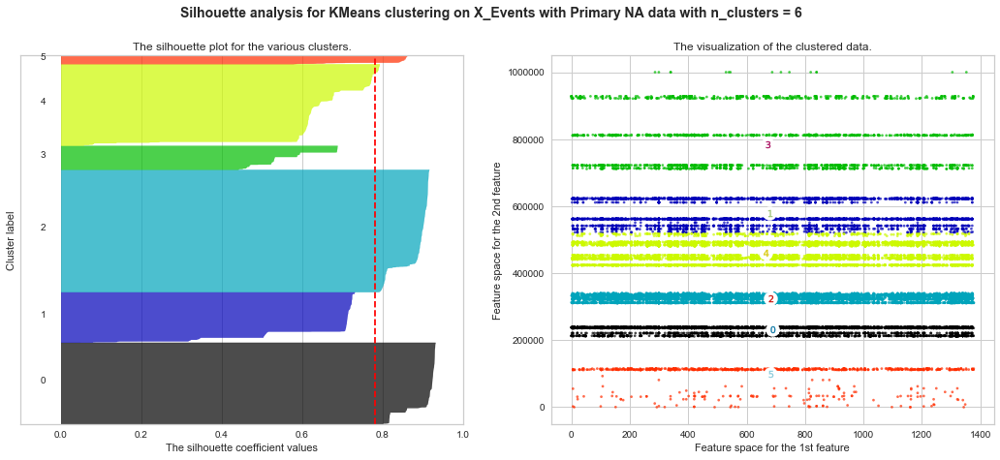

For n_clusters = 8 The average silhouette_score is : 0.7910531948978675


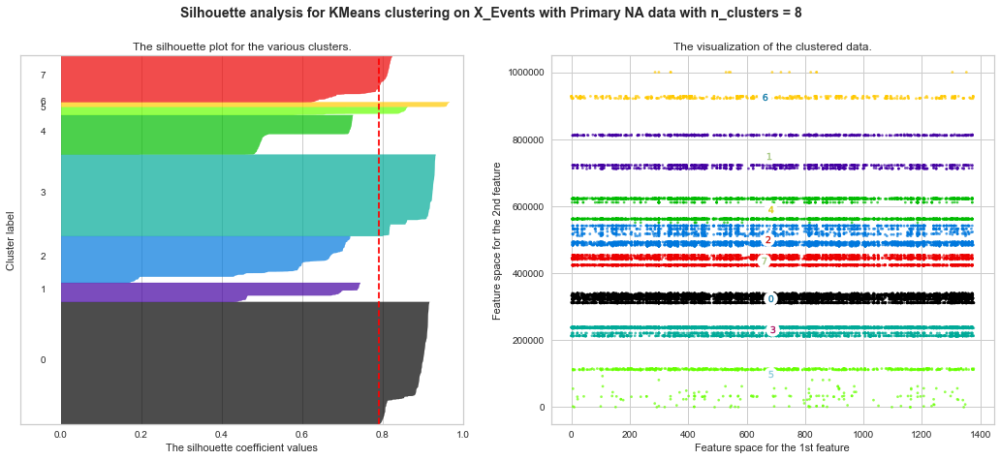

For n_clusters = 10 The average silhouette_score is : 0.8485042953973768


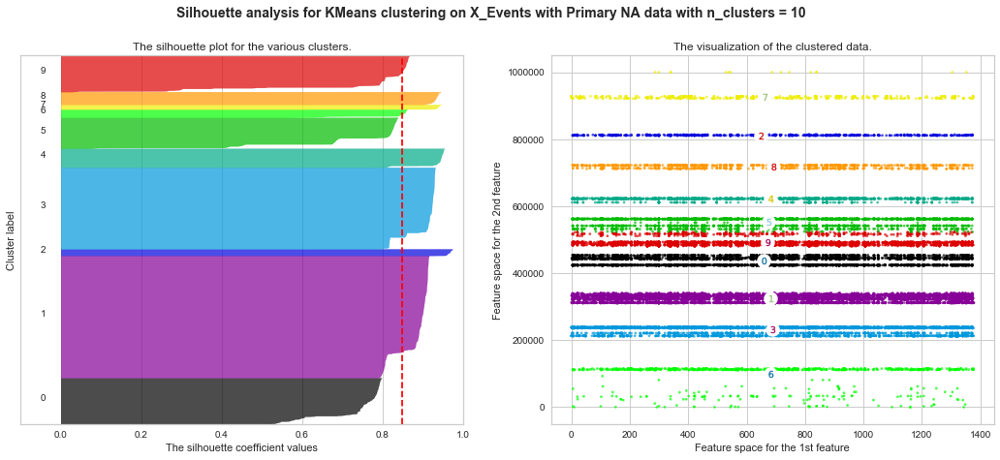

For n_clusters = 12 The average silhouette_score is : 0.7473277635138971


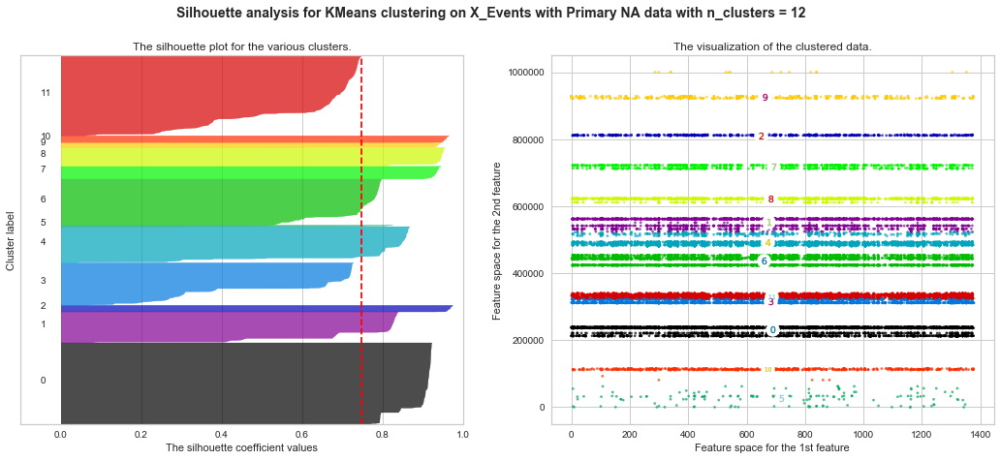

For n_clusters = 4 The average silhouette_score is : 0.7165936844330645


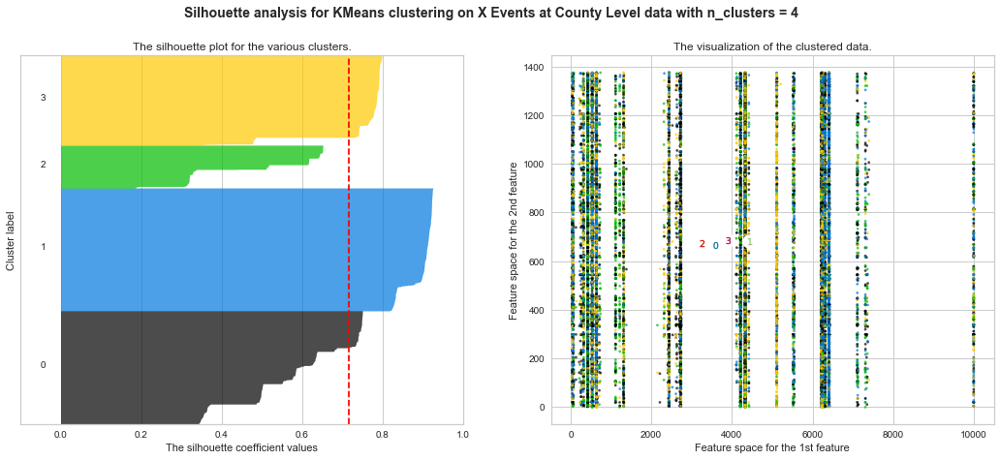

For n_clusters = 6 The average silhouette_score is : 0.780634042383989


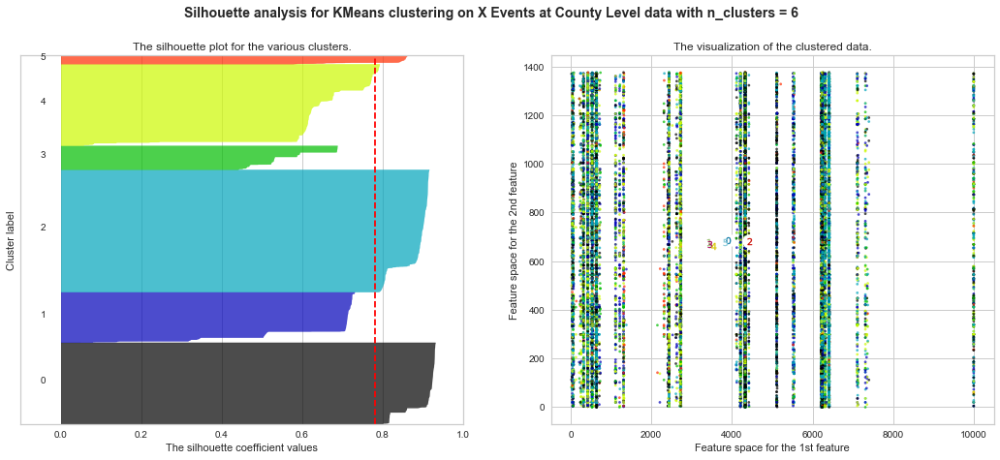

For n_clusters = 8 The average silhouette_score is : 0.7910531936389364


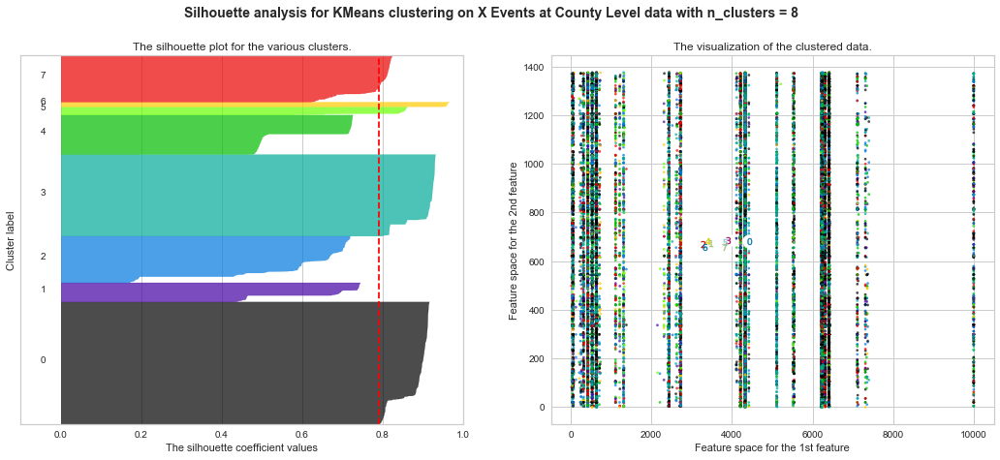

For n_clusters = 10 The average silhouette_score is : 0.8485042939278196


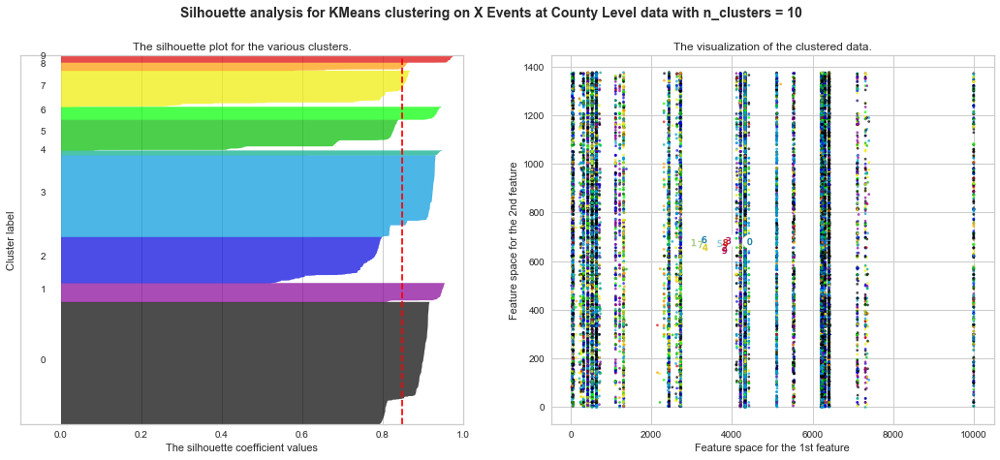

For n_clusters = 12 The average silhouette_score is : 0.7473277579395639


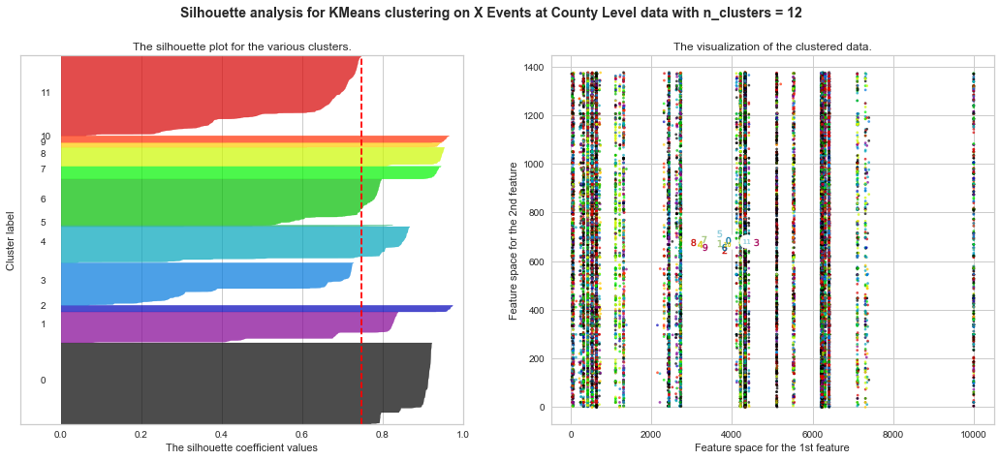

In [123]:
for feature in features:
    silhouette_plot(feature)

For n_clusters = 4 The average silhouette_score is : 0.8574043448625206


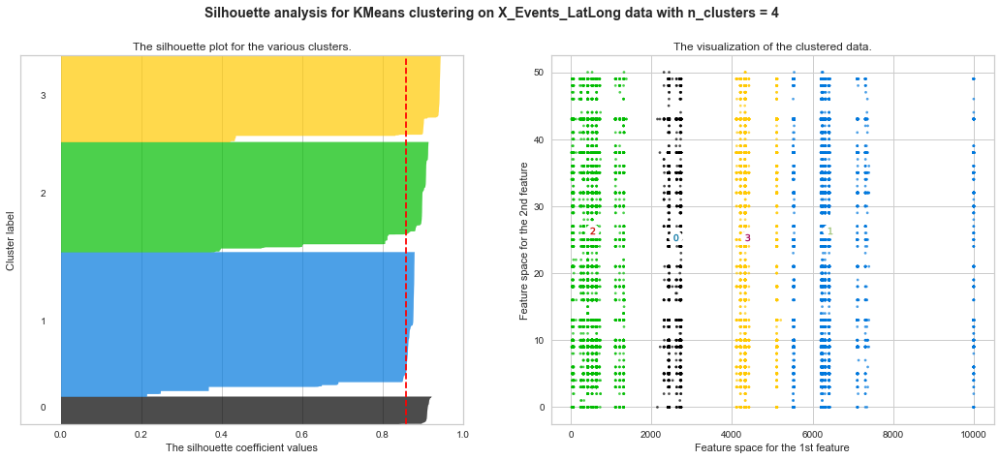

For n_clusters = 6 The average silhouette_score is : 0.8796231320162953


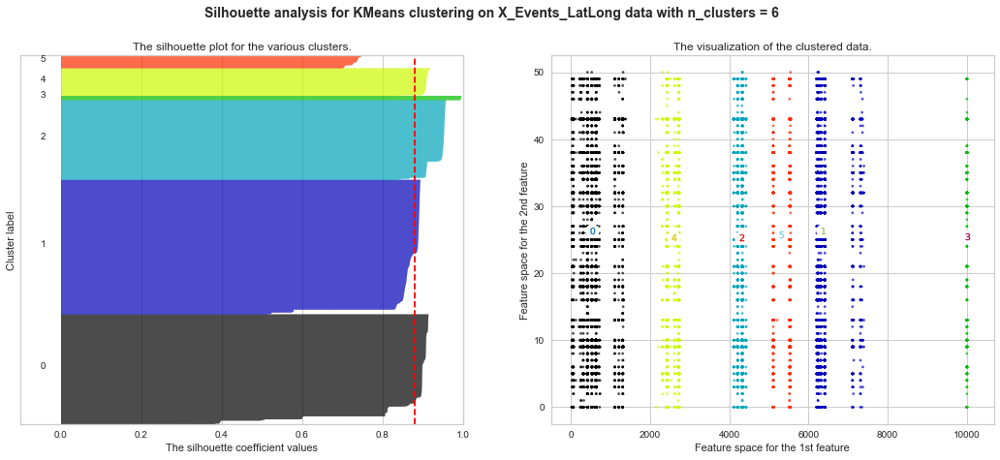

For n_clusters = 8 The average silhouette_score is : 0.8519331683420184


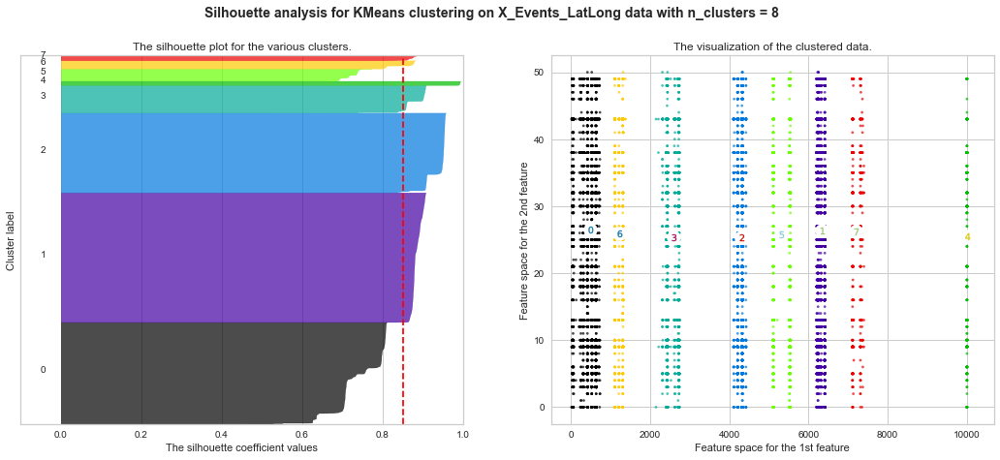

For n_clusters = 10 The average silhouette_score is : 0.7841574782627705


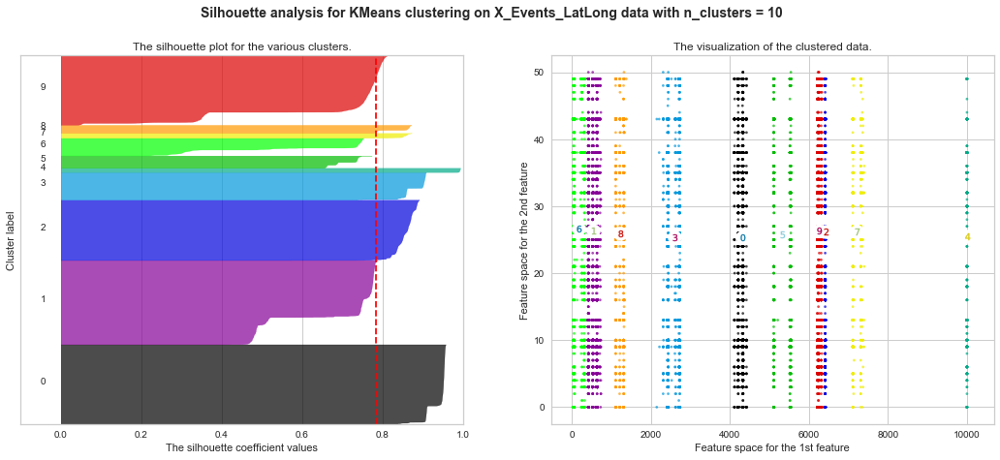

For n_clusters = 12 The average silhouette_score is : 0.7929657518942392


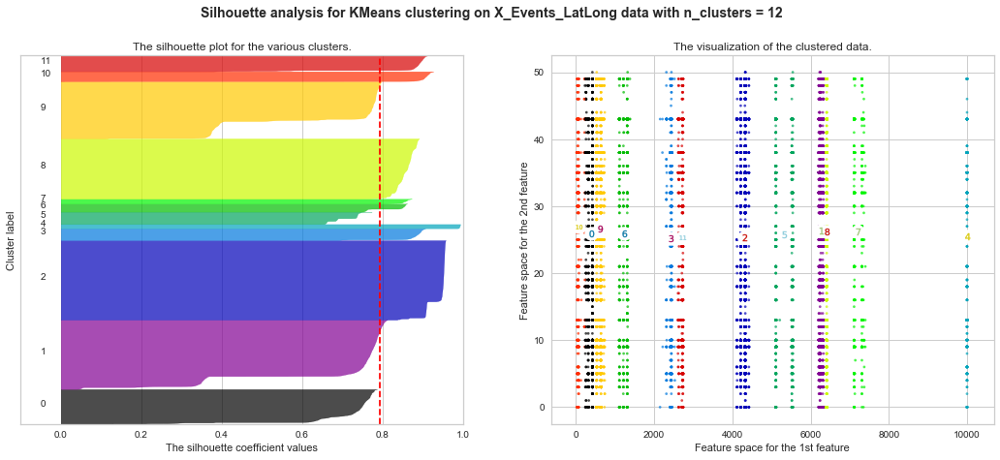

In [122]:
silhouette_plot(X_events_LL)

For n_clusters = 2 The average silhouette_score is : 0.7584289488364169


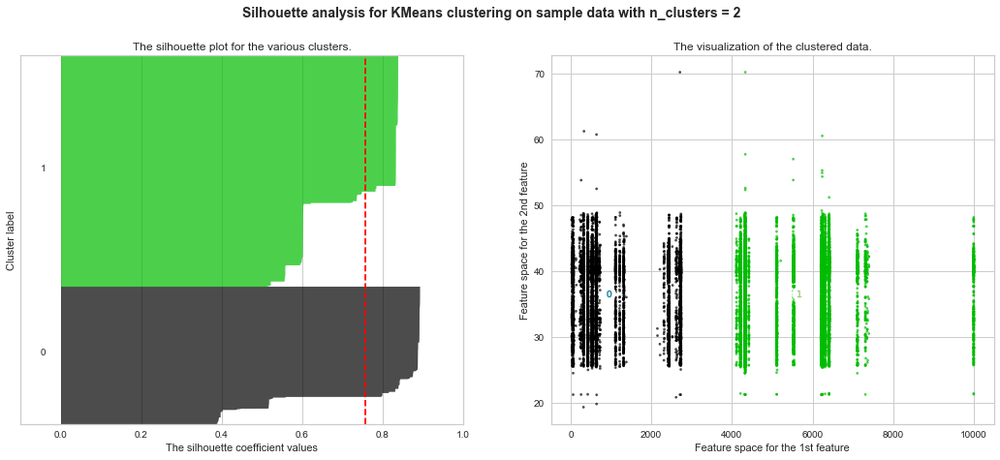

For n_clusters = 4 The average silhouette_score is : 0.8595575349488878


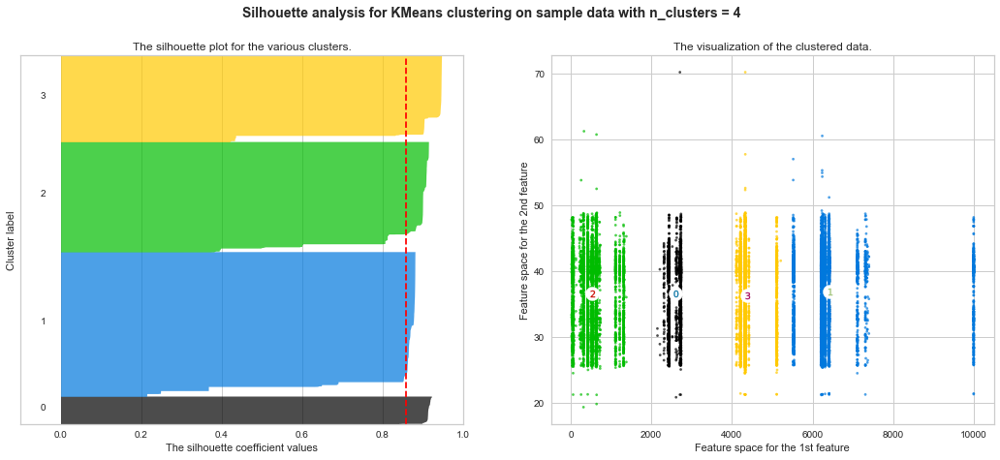

For n_clusters = 6 The average silhouette_score is : 0.8834568111054799


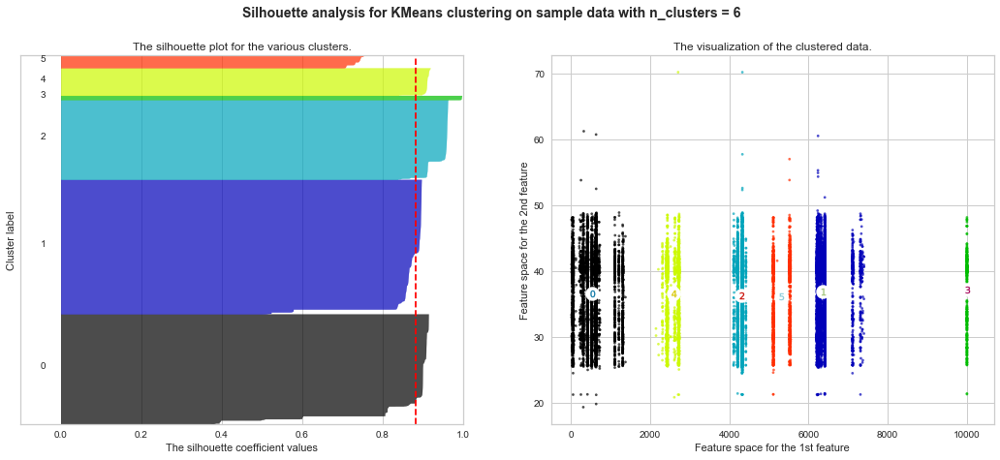

For n_clusters = 8 The average silhouette_score is : 0.8573162569734585


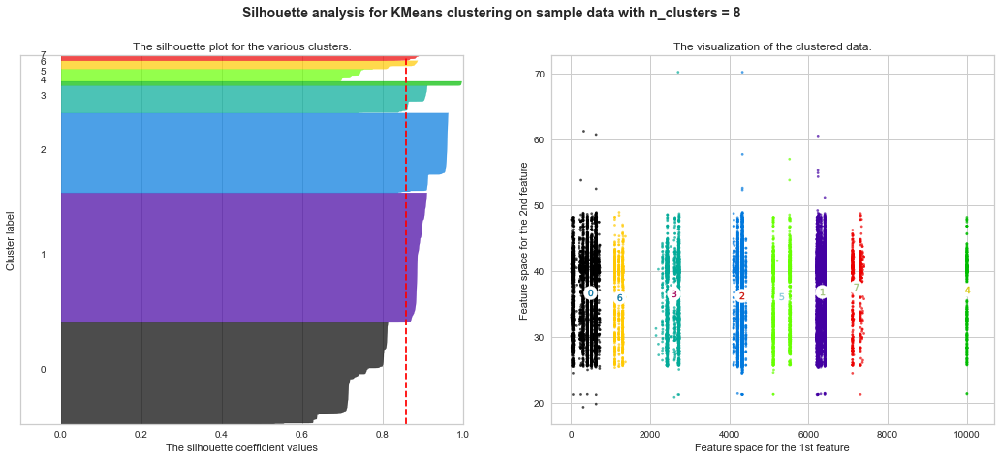

For n_clusters = 10 The average silhouette_score is : 0.8490911421056363


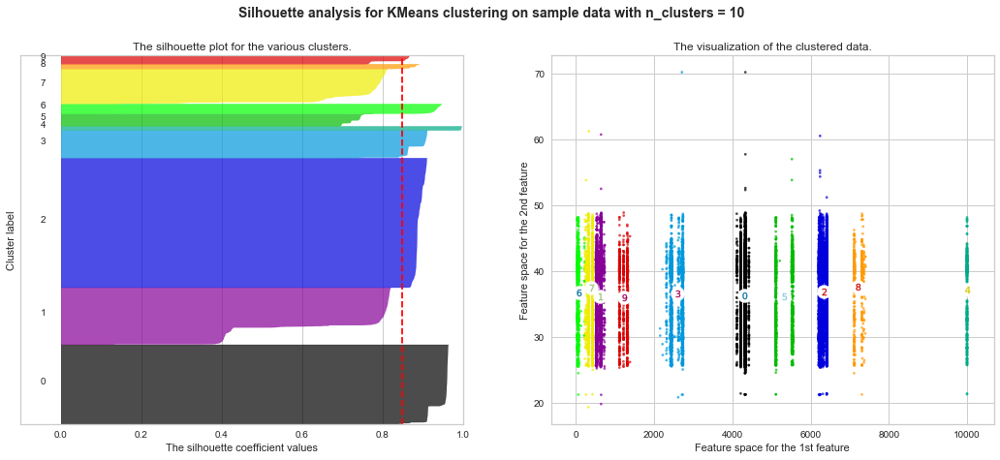

In [82]:
featuresLL=['UPA','Event','Latitude','Longitude']
targetsLL=['Hospitaliz']

events_LL = data[featuresLL]
events_LL.set_index('UPA',inplace=True)
events_LL.name = "Events with Lat & Long"
silhouette_plot(events_LL)

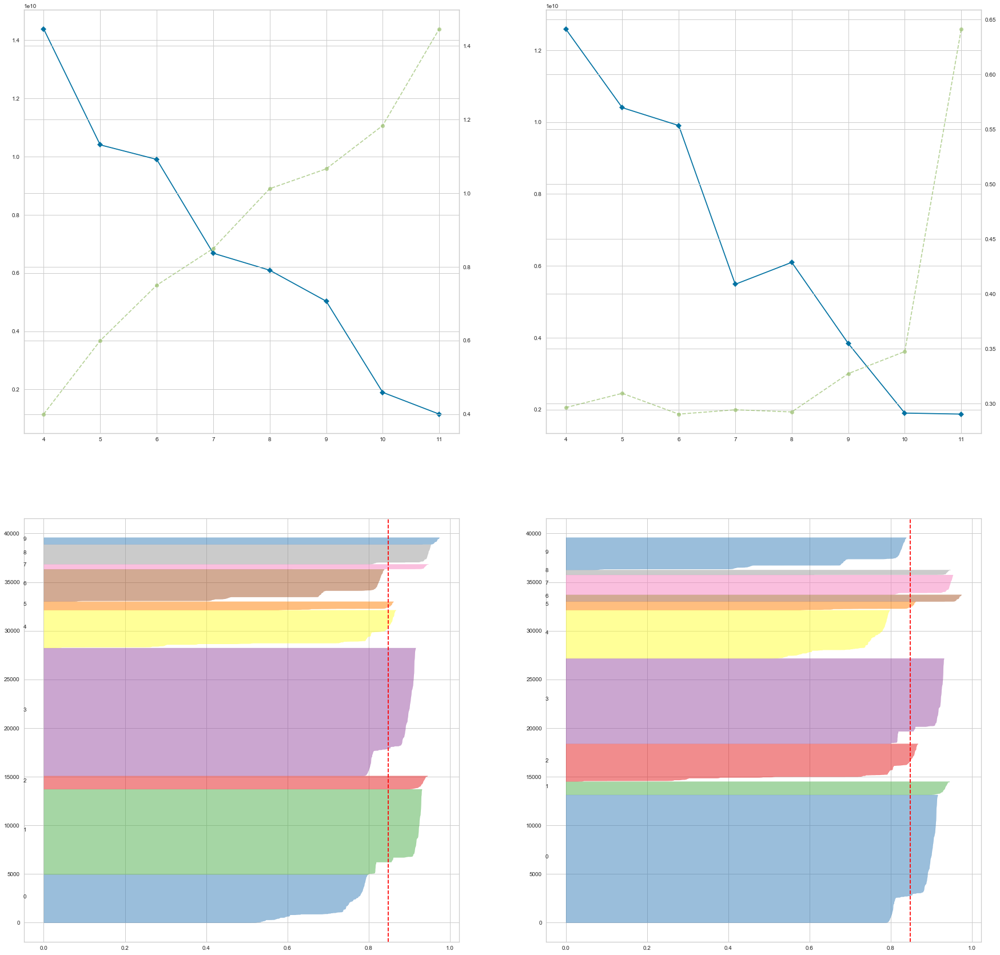

In [21]:
fig, axes = plt.subplots(2, 2, figsize=(30,30))
         
visualgrid = [
    KElbowVisualizer(KMeans(10,n_init=15), k=(4,12),ax=axes[0][0]),
    KElbowVisualizer(MiniBatchKMeans(10,n_init=15),k=(4,12), ax=axes[0][1]),
    SilhouetteVisualizer(MiniBatchKMeans(10, n_init=15),ax=axes[1][0]),
    SilhouetteVisualizer(KMeans(10, n_init=15), ax=axes[1][1]),

]

for viz in visualgrid:
    viz.fit(Xevents2)

plt.show()

### Creating a 3D Plot to better understand the clustering

Creating a 3D projected scatter plot both in Plotly and Matplotlib, we plotted the clustered data using:
- County as X-axis
- Primary NAICS code as Y-axis
- Event code as the Z-Axis

In [4]:
def threedimplot(data,n_clusters):
    estimator=KMeans(n_clusters, n_init=15)
    estimator.fit(data)
    
    Y=estimator.predict(data)
    
    df=pd.DataFrame(data)
    df['y']= Y
    
    cluster1=df.loc[df['y']==0]
    cluster2=df.loc[df['y']==1]
    cluster3=df.loc[df['y']==2]
    cluster4=df.loc[df['y']==3]
    cluster5=df.loc[df['y']==4]
    cluster6=df.loc[df['y']==5]
    cluster7=df.loc[df['y']==6]
    cluster8=df.loc[df['y']==7]
    cluster9=df.loc[df['y']==8]
    cluster10=df.loc[df['y']==9]
    
    scatter1= dict(
        mode='markers',
        name='Cluster 1',
        type='scatter3d',
        x=cluster1.as_matrix()[:,0],y=cluster1.as_matrix()[:,1],z=cluster1.as_matrix()[:,2],
        marker= dict( size=2, color='green')
    )
    
    scatter2= dict(
        mode='markers',
        name='Cluster 2',
        type='scatter3d',
        x=cluster2.as_matrix()[:,0],y=cluster2.as_matrix()[:,1],z=cluster2.as_matrix()[:,2],
        marker= dict( size=2, color='blue'))

    scatter3= dict(
        mode='markers',
        name='Cluster 3',
        type='scatter3d',
        x=cluster3.as_matrix()[:,0],y=cluster3.as_matrix()[:,1],z=cluster3.as_matrix()[:,2],
        marker= dict( size=2, color='red')
    )

    scatter4= dict(
        mode='markers',
        name='Cluster 4',
        type='scatter3d',
        x=cluster4.as_matrix()[:,0],y=cluster4.as_matrix()[:,1],z=cluster4.as_matrix()[:,2],
        marker= dict( size=2, color='yellow')
    )
    
    scatter5= dict(
        mode='markers',
        name='Cluster 5',
        type='scatter3d',
        x=cluster5.as_matrix()[:,0],y=cluster5.as_matrix()[:,1],z=cluster5.as_matrix()[:,2],
        marker= dict( size=2, color='brown')
    )
    
    scatter6= dict(
        mode='markers',
        name='Cluster 6',
        type='scatter3d',
        x=cluster6.as_matrix()[:,0],y=cluster6.as_matrix()[:,1],z=cluster6.as_matrix()[:,2],
        marker= dict( size=2, color='purple')
    )
    
    scatter7= dict(
        mode='markers',
        name='Cluster 7',
        type='scatter3d',
        x=cluster7.as_matrix()[:,0],y=cluster7.as_matrix()[:,1],z=cluster7.as_matrix()[:,2],
        marker= dict( size=2, color='magenta')
    )
    
    
    scatter8= dict(
        mode='markers',
        name='Cluster 8',
        type='scatter3d',
        x=cluster8.as_matrix()[:,0],y=cluster8.as_matrix()[:,1],z=cluster8.as_matrix()[:,2],
        marker= dict( size=2, color='orange')
    )
    
    
    scatter9= dict(
        mode='markers',
        name='Cluster 9',
        type='scatter3d',
        x=cluster9.as_matrix()[:,0],y=cluster9.as_matrix()[:,1],z=cluster9.as_matrix()[:,2],
        marker= dict( size=2, color='pink')
    )
    
    
    scatter10= dict(
        mode='markers',
        name='Cluster 10',
        type='scatter3d',
        x=cluster10.as_matrix()[:,0],y=cluster10.as_matrix()[:,1],z=cluster10.as_matrix()[:,2],
        marker= dict( size=2, color='maroon')
    )
    
    
    cluster1 = dict(
        alphahull = 5,
        name = "Cluster 1",
        opacity = .1,
        type = "mesh3d",    
        x = cluster1.as_matrix()[:,0], y = cluster1.as_matrix()[:,1], z = cluster1.as_matrix()[:,2],
        color='green', showscale = True
    )
    
    cluster2 = dict(
        alphahull = 5,
        name = "Cluster 2",
        opacity = .1,
        type = "mesh3d",    
        x = cluster2.as_matrix()[:,0], y = cluster2.as_matrix()[:,1], z = cluster2.as_matrix()[:,2],
        color='blue', showscale = True
    )    
    
    cluster3 = dict(
        alphahull = 5,
        name = "Cluster 3",
        opacity = .1,
        type = "mesh3d",    
        x = cluster3.as_matrix()[:,0], y = cluster3.as_matrix()[:,1], z = cluster3.as_matrix()[:,2],
        color='red', showscale = True
    )    
    
    cluster4 = dict(
        alphahull = 5,
        name = "Cluster 4",
        opacity = .1,
        type = "mesh3d",    
        x = cluster4.as_matrix()[:,0], y = cluster4.as_matrix()[:,1], z = cluster4.as_matrix()[:,2],
        color='yellow', showscale = True
    )    

    cluster5 = dict(
        alphahull = 5,
        name = "Cluster 5",
        opacity = .1,
        type = "mesh3d",    
        x = cluster5.as_matrix()[:,0], y = cluster5.as_matrix()[:,1], z = cluster5.as_matrix()[:,2],
        color='brown', showscale = True
    )

    cluster6 = dict(
        alphahull = 5,
        name = "Cluster 6",
        opacity = .1,
        type = "mesh3d",    
        x = cluster6.as_matrix()[:,0], y = cluster6.as_matrix()[:,1], z = cluster6.as_matrix()[:,2],
        color='purple', showscale = True
    )    

    cluster7 = dict(
        alphahull = 5,
        name = "Cluster 7",
        opacity = .1,
        type = "mesh3d",    
        x = cluster7.as_matrix()[:,0], y = cluster7.as_matrix()[:,1], z = cluster7.as_matrix()[:,2],
        color='magenta', showscale = True
    )    
    
    cluster8 = dict(
        alphahull = 5,
        name = "Cluster 8",
        opacity = .1,
        type = "mesh3d",    
        x = cluster8.as_matrix()[:,0], y = cluster8.as_matrix()[:,1], z = cluster8.as_matrix()[:,2],
        color='orange', showscale = True
    )    

    cluster9 = dict(
        alphahull = 5,
        name = "Cluster 9",
        opacity = .1,
        type = "mesh3d",    
        x = cluster9.as_matrix()[:,0], y = cluster9.as_matrix()[:,1], z = cluster9.as_matrix()[:,2],
        color='pink', showscale = True
    )    

    cluster10 = dict(
        alphahull = 5,
        name = "Cluster 10",
        opacity = .1,
        type = "mesh3d",    
        x = cluster10.as_matrix()[:,0], y = cluster10.as_matrix()[:,1], z = cluster10.as_matrix()[:,2],
        color='maroon', showscale = True
    )    
        
    layout = dict(
        title = 'Interactive Cluster Shapes in 3D',
        scene = dict(
            xaxis = dict( zeroline=True ),
            yaxis = dict( zeroline=True ),
            zaxis = dict( zeroline=True ),
        )
    )
    fig = dict( data=[scatter1, scatter2, scatter3, scatter4, scatter5, scatter6, scatter7, scatter8, scatter9, scatter10, 
                      cluster1, cluster2, cluster3, cluster4, cluster5, cluster6, cluster7, cluster8, cluster9, cluster10],
               layout=layout )

    # Use py.iplot() for IPython notebook
    plotly.offline.iplot(fig, filename='mesh3d_sample')

In [9]:
plotly.offline.init_notebook_mode()

threedimplot(Xevents2, 10)

#### Matplotlib 3D Plot

As a reminder we used:
- County as X-axis
- Primary NAICS code as Y-axis
- Event code as the Z-Axis

In [233]:
def matplotlib3d(data, n_clusters):
    estimator=KMeans(n_clusters, n_init=15)
    estimator.fit(data)
    
    Y=estimator.predict(data)
    
    df=pd.DataFrame(data)
    df['Cluster']= Y    
    
    fig = plt.figure(figsize=(30,30))
    ax = fig.add_subplot(111, projection='3d')
    x = np.array(df.iloc[:,0])
    y = np.array(df.iloc[:,1])
    z = np.array(df.iloc[:,2])

    ax.scatter(x,y,z, marker="s", c=df["Cluster"], s=40, cmap="RdBu")

    plt.show()

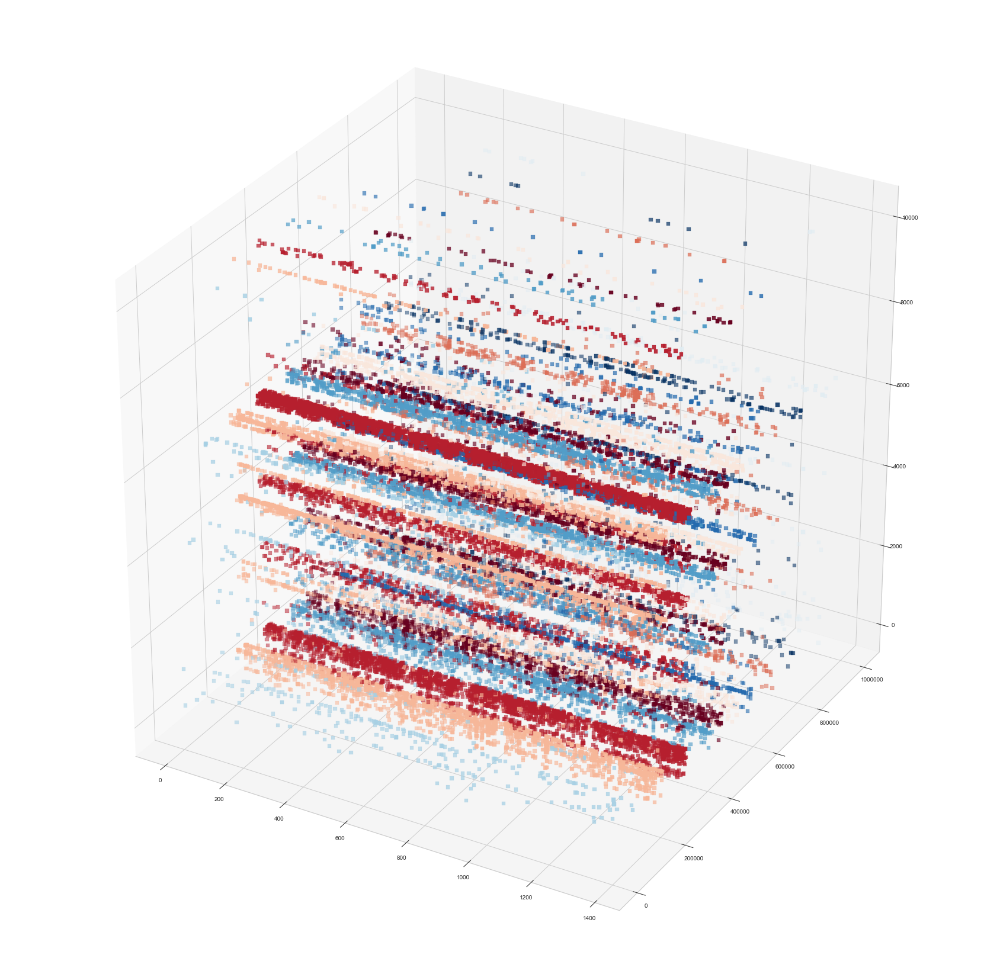

In [163]:
matplotlib3d(Xevents2,10)

### Getting the clusters back into the original data.

Next we join the clustered feature-set back to original data that was loaded from the CSV. This will enable us to better understand the contents and trends of the clusters.

In [165]:
data.head()
joined_data = data.merge(Xevents2, how='outer',on='UPA')
joined_data.head()

,UPA,EventDate,State,Latitude,Longitude,Primary NA_x,Hospitaliz,Amputation,Nature,BodyPart,Part_of _1,Event_x,Source,NAMELSAD,Month,Year,InsideUS,Day,NAMELSAD_Codes_x,NAMELSAD_Codes_y,Primary NA_y,Event_y,Cluster
0,1228909,2017-06-15,27,41.83,-96.71,311119,0,1,1311,4429,"Finger(s), fingernail(s), n.e.c.",6412,3714,Cuming County,6,2017,1,15,332,332,311119,6412,1
1,1238273,2017-06-24,27,41.79,-96.70,311512,0,1,1311,4422,Fingertip(s),6411,3421,Cuming County,6,2017,1,24,332,332,311512,6411,1
2,1384150,2018-09-17,27,41.79,-96.70,311512,1,0,1729,6,BODY SYSTEMS,531,9262,Cuming County,9,2018,1,17,332,332,311512,531,1
3,930752,2015-01-06,27,40.98,-96.60,236220,1,0,111,52,Ankle(s),40,660,Lancaster County,1,2015,1,6,698,698,236220,40,3
4,933523,2015-01-20,27,40.87,-96.62,331511,1,0,111,510,"Leg(s), unspecified",6260,3460,Lancaster County,1,2015,1,20,698,698,331511,6260,1


In [167]:
joined_data.drop(['NAMELSAD_Codes_y','Primary NA_y','Event_y'],axis=1, inplace=True)

In [168]:
joined_data.rename(columns={'Event_x':'Event','NAMELSAD_Codes_x':'NAMELSAD_Codes','Primary NA_x':'Primary NA'},inplace=True)

In [169]:
joined_data.head()

,UPA,EventDate,State,Latitude,Longitude,Primary NA,Hospitaliz,Amputation,Nature,BodyPart,Part_of _1,Event,Source,NAMELSAD,Month,Year,InsideUS,Day,NAMELSAD_Codes,Cluster
0,1228909,2017-06-15,27,41.83,-96.71,311119,0,1,1311,4429,"Finger(s), fingernail(s), n.e.c.",6412,3714,Cuming County,6,2017,1,15,332,1
1,1238273,2017-06-24,27,41.79,-96.70,311512,0,1,1311,4422,Fingertip(s),6411,3421,Cuming County,6,2017,1,24,332,1
2,1384150,2018-09-17,27,41.79,-96.70,311512,1,0,1729,6,BODY SYSTEMS,531,9262,Cuming County,9,2018,1,17,332,1
3,930752,2015-01-06,27,40.98,-96.60,236220,1,0,111,52,Ankle(s),40,660,Lancaster County,1,2015,1,6,698,3
4,933523,2015-01-20,27,40.87,-96.62,331511,1,0,111,510,"Leg(s), unspecified",6260,3460,Lancaster County,1,2015,1,20,698,1


In [170]:
joined_data.to_csv('./clustered_events.csv')

## Clustering Exploration Conclusions

After running multiple evaluations we are choosing to use KMeans clustering with the following parameters:

- k= 8-10 clusters returns Silhouette Scores in the .83-.85 range
- The following features from our dataframe seem to cluster well:
    - Event: Numerical values associated with type of injury/incident that caused the severe injury report.
    - Primary NAIC ("Primary NA"): The North American Industrial Classification System numbers. These are codes that represent different types of Industrial jobs.
    - NAMELSAD: United States Counties 
    
    
- The datasets that seem to cluster best:
    - Xevents: A simplified feature-set with just Event code & State
    - Xevents2: Slightly less simplified feature-set including Events, County name and Primary NAICS code
    - X_events_LL: Featureset with Event Code, State, Latitude and Longitude



Oh yeah...one more thing

## Ludicrous Speed!

"Buckle this!"

Here we're trying to max out the clustering and see what happens (why not right?). Thousands of iterations, same clusters. We'll test the different embedding default settings as well.

There still remains a bit of overlap between clusters.

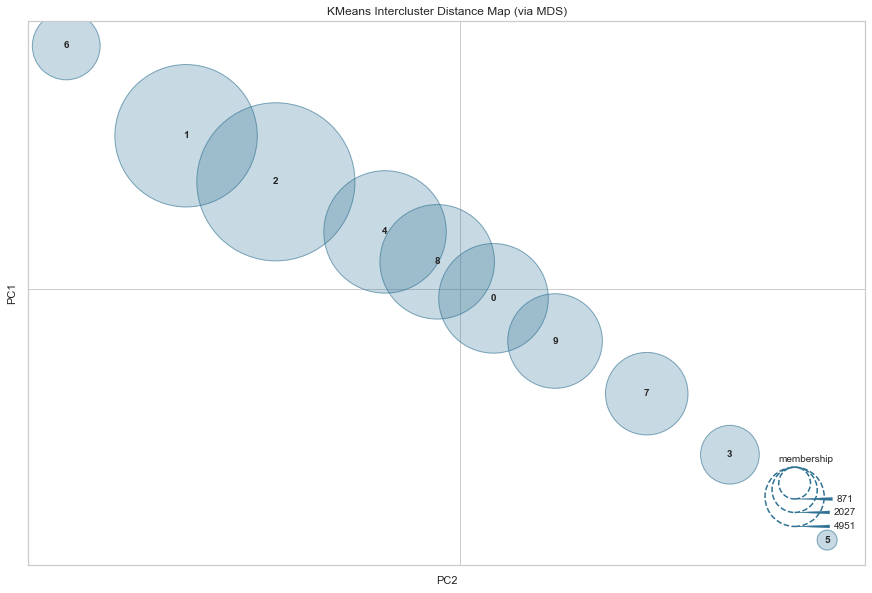

In [50]:
visualizer = InterclusterDistance(KMeans(10),size=(1080,720),legend_loc='lower right', maxint=5000,
                                  embeddingdefault='mds',n_iter=3000,max_iter=5000)

visualizer.fit(Xevents2)
visualizer.poof()

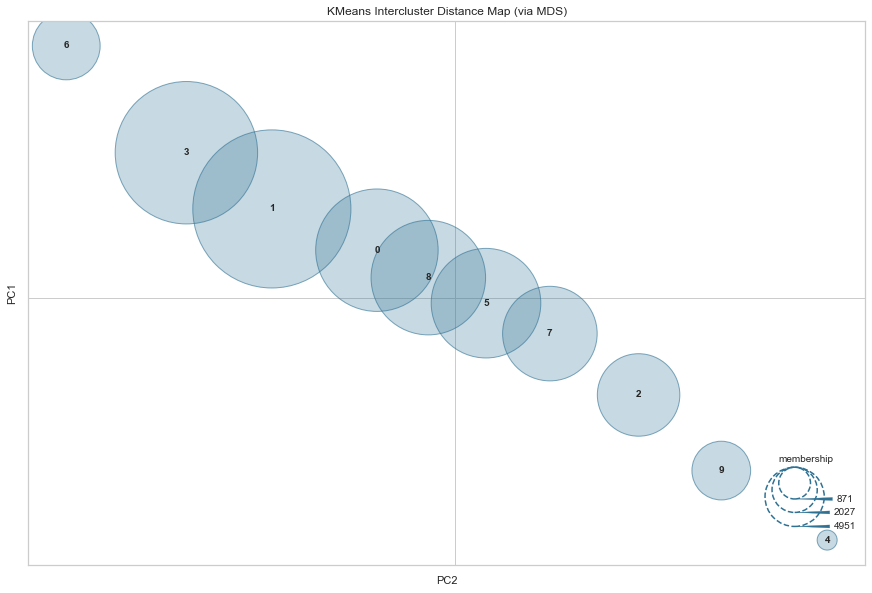

In [51]:
visualizer = InterclusterDistance(KMeans(10),size=(1080,720),legend_loc='lower right', maxint=5000,
                                  embeddingdefault='tsne',n_iter=3000,max_iter=5000)

visualizer.fit(Xevents2)
visualizer.poof()